# - 데이터 전처리(상권 분석) : 샛별

### - 2021년

In [ ]:
import pandas as pd
import missingno as msno

In [ ]:
#내 환경에 한글폰트 설치(일단 나눔이라는 폰트 1개만)
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf

Reading package lists... Done
Building dependency tree       
Reading state information... Done
fonts-nanum is already the newest version (20170925-1).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'sudo apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 42 not upgraded.
/usr/share/fonts: caching, new cache contents: 0 fonts, 1 dirs
/usr/share/fonts/truetype: caching, new cache contents: 0 fonts, 3 dirs
/usr/share/fonts/truetype/humor-sans: caching, new cache contents: 1 fonts, 0 dirs
/usr/share/fonts/truetype/liberation: caching, new cache contents: 16 fonts, 0 dirs
/usr/share/fonts/truetype/nanum: caching, new cache contents: 10 fonts, 0 dirs
/usr/local/share/fonts: caching, new cache contents: 0 fonts, 0 dirs
/root/.local/share/fonts: skipping, no such directory
/root/.fonts: skipping, no such directory
/var/cache/fontconfig: cleaning cache directory
/root/.cache/fontconfig: not cleaning non-existent

In [ ]:
import matplotlib.pyplot as plt
plt.rc('font', family='NanumBarunGothic') 
#matplotlib의 폰트를 Nanum 폰트로 지정합니다

#하고나서 꼭 Ctrl + M을 눌러야함

In [ ]:
commercial_area = pd.read_csv('./data/commercial_area2021.csv')
commercial_info = pd.read_csv('/data/commercial_info_2021.csv')

In [ ]:
miss = commercial_info.isnull().sum()
miss

상호명              1
상권업종대분류코드        0
상권업종대분류명         0
상권업종중분류코드        0
상권업종중분류명         0
상권업종소분류코드        0
상권업종소분류명         0
표준산업분류코드     19107
표준산업분류명      19107
시군구코드            0
시군구명             0
행정동코드            0
행정동명             5
법정동코드            0
법정동명             0
경도               0
위도               0
dtype: int64

In [ ]:
not_use = miss.sort_values(ascending=False).head(2)
not_use

표준산업분류명     19107
표준산업분류코드    19107
dtype: int64

In [ ]:
not_use_col = not_use.index
not_use_col

Index(['표준산업분류명', '표준산업분류코드'], dtype='object')

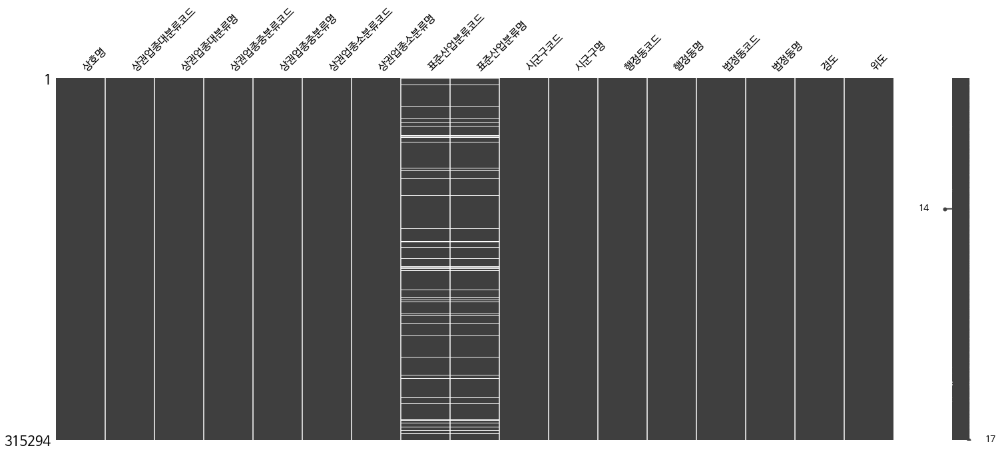

In [ ]:
msno.matrix(commercial_info)

In [ ]:
print(commercial_info.shape)
commercial_info = commercial_info.drop(not_use_col, axis=1)
print(commercial_info.shape)

(315294, 17)
(315294, 15)


In [ ]:
miss1 = commercial_info.isnull().sum()
miss1

상호명          1
상권업종대분류코드    0
상권업종대분류명     0
상권업종중분류코드    0
상권업종중분류명     0
상권업종소분류코드    0
상권업종소분류명     0
시군구코드        0
시군구명         0
행정동코드        0
행정동명         5
법정동코드        0
법정동명         0
경도           0
위도           0
dtype: int64

In [ ]:
commercial_info[commercial_info['행정동명'].isnull()]

,상호명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,시군구코드,시군구명,행정동코드,행정동명,법정동코드,법정동명,경도,위도
61855,한양마트,D,소매,D03,종합소매점,D03B10,할인점,11305,강북구,1130560600,NaN,1130510200,번동,127.041401,37.626804
102354,북두인테리어,D,소매,D07,가정/주방/인테리어,D07A01,인테리어/욕실용품/커튼,11305,강북구,1130562000,NaN,1130510300,수유동,127.018631,37.643133
113913,성북가전가구재활용,D,소매,D24,중고품소매/교환,D24A03,중고가전가구,11305,강북구,1130561000,NaN,1130510300,수유동,127.017727,37.633457
128665,놀숲,F,생활서비스,F07,물품기기대여,F07A04,도서/만화대여,11305,강북구,1130563000,NaN,1130510300,수유동,127.024171,37.637962
138172,혜지귀금속수유,D,소매,D26,시계/귀금속소매,D26A01,시계/귀금속,11305,강북구,1130561000,NaN,1130510300,수유동,127.023437,37.631685


### - 각각의 결측치에 맞는 행정동명을 행정동코드를 이용해  추출하기

In [ ]:
# 번3동
commercial_info[commercial_info['행정동코드'] == 1130560600]

,상호명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,시군구코드,시군구명,행정동코드,행정동명,법정동코드,법정동명,경도,위도
14895,드림모터스,D,소매,D23,자동차/자동차용품,D23A02,중고자동차판매,11305,강북구,1130560600,번3동,1130510200,번동,127.043793,37.628446
61855,한양마트,D,소매,D03,종합소매점,D03B10,할인점,11305,강북구,1130560600,NaN,1130510200,번동,127.041401,37.626804
83730,벼락고깃집,Q,음식,Q01,한식,Q01A02,갈비/삼겹살,11305,강북구,1130560600,번3동,1130510200,번동,127.039856,37.628873
129777,카페끄레마,Q,음식,Q12,커피점/카페,Q12A01,커피전문점/카페/다방,11305,강북구,1130560600,번3동,1130510200,번동,127.045215,37.620906
133916,토즈수학교습소,R,학문/교육,R01,학원-보습교습입시,R01A01,학원-입시,11305,강북구,1130560600,번3동,1130510200,번동,127.041719,37.627600
143169,하얀풍경미술교습소,R,학문/교육,R05,학원-음악미술무용,R05A01,서예/서화/미술,11305,강북구,1130560600,번3동,1130510200,번동,127.046831,37.626497
144858,한국건강원,D,소매,D10,건강/미용식품,D10A07,건강원,11305,강북구,1130560600,번3동,1130510200,번동,127.044097,37.625898
197125,olleh,D,소매,D18,사진/광학/정밀기기소매,D18A02,핸드폰소매,11305,강북구,1130560600,번3동,1130510200,번동,127.041392,37.627453
202074,희망정보통신,D,소매,D18,사진/광학/정밀기기소매,D18A02,핸드폰소매,11305,강북구,1130560600,번3동,1130510200,번동,127.036888,37.626263
209432,대한창호,D,소매,D07,가정/주방/인테리어,D07A14,지물판매,11305,강북구,1130560600,번3동,1130510200,번동,127.045819,37.623299


In [ ]:
# 수유2동
commercial_info[commercial_info['행정동코드'] == 1130562000]

,상호명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,시군구코드,시군구명,행정동코드,행정동명,법정동코드,법정동명,경도,위도
2695,경기종합건축인테리어,D,소매,D07,가정/주방/인테리어,D07A01,인테리어/욕실용품/커튼,11305,강북구,1130562000,수유2동,1130510300,수유동,127.017049,37.647940
10235,사슴인테리어,D,소매,D07,가정/주방/인테리어,D07A01,인테리어/욕실용품/커튼,11305,강북구,1130562000,수유2동,1130510300,수유동,127.020310,37.642913
30047,마미수퍼,D,소매,D03,종합소매점,D03A02,수퍼마켓,11305,강북구,1130562000,수유2동,1130510300,수유동,127.017444,37.648043
37480,궁전기사님회관,Q,음식,Q01,한식,Q01A21,기사식당,11305,강북구,1130562000,수유2동,1130510300,수유동,127.016174,37.647257
53476,시골농장,Q,음식,Q01,한식,Q01A02,갈비/삼겹살,11305,강북구,1130562000,수유2동,1130510300,수유동,127.014959,37.648310
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
235213,아이플라워유,D,소매,D02,선물/팬시/기념품,D02A02,꽃집/꽃배달,11305,강북구,1130562000,수유2동,1130510300,수유동,127.019762,37.645846
244948,엘림미용실,F,생활서비스,F01,이/미용/건강,F01A01,여성미용실,11305,강북구,1130562000,수유2동,1130510300,수유동,127.021962,37.646576
246992,엉클조안장리폼,F,생활서비스,F03,개인/가정용품수리,F03A08,옷수선,11305,강북구,1130562000,수유2동,1130510300,수유동,127.020504,37.643707
250191,카트카인테리어,D,소매,D23,자동차/자동차용품,D23A07,자동차장식품판매,11305,강북구,1130562000,수유2동,1130510300,수유동,127.016433,37.643917


In [ ]:
# 수유1동
commercial_info[commercial_info['행정동코드'] == 1130561000]

,상호명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,시군구코드,시군구명,행정동코드,행정동명,법정동코드,법정동명,경도,위도
11988,백운기사식당,Q,음식,Q01,한식,Q01A21,기사식당,11305,강북구,1130561000,수유1동,1130510300,수유동,127.018747,37.633439
15230,모아공인중개사사무소,L,부동산,L01,부동산중개,L01A01,부동산중개,11305,강북구,1130561000,수유1동,1130510300,수유동,127.019502,37.633706
59179,신흥건어물,D,소매,D01,음/식료품소매,D01A11,건어물상,11305,강북구,1130561000,수유1동,1130510300,수유동,127.022307,37.631522
59314,원조장충족발,Q,음식,Q01,한식,Q01A08,족발/보쌈전문,11305,강북구,1130561000,수유1동,1130510300,수유동,127.022646,37.630723
59623,옛곰탕집,Q,음식,Q01,한식,Q01A09,설렁탕집,11305,강북구,1130561000,수유1동,1130510300,수유동,127.022307,37.631522
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
233911,예뜰미술교습소,R,학문/교육,R05,학원-음악미술무용,R05A01,서예/서화/미술,11305,강북구,1130561000,수유1동,1130510300,수유동,127.015341,37.628779
241937,새마을부동산,L,부동산,L01,부동산중개,L01A01,부동산중개,11305,강북구,1130561000,수유1동,1130510300,수유동,127.019210,37.630974
249290,예스이사이사,F,생활서비스,F04,운송/배달/택배,F04A06,종합이삿짐대행,11305,강북구,1130561000,수유1동,1130510300,수유동,127.013749,37.632694
251908,박오토바이,F,생활서비스,F14,자동차/이륜차,F14A03,오토바이판매/수리,11305,강북구,1130561000,수유1동,1130510300,수유동,127.018031,37.630964


In [ ]:
# 수유3동
commercial_info[commercial_info['행정동코드'] == 1130563000]

,상호명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,시군구코드,시군구명,행정동코드,행정동명,법정동코드,법정동명,경도,위도
7956,가장맛있는곱창곱과의동침부추곱창,Q,음식,Q01,한식,Q01A03,곱창/양구이전문,11305,강북구,1130563000,수유3동,1130510300,수유동,127.024743,37.639309
16630,유플러스스퀘어,D,소매,D18,사진/광학/정밀기기소매,D18A02,핸드폰소매,11305,강북구,1130563000,수유3동,1130510300,수유동,127.025465,37.641243
34494,천일제화,D,소매,D06,가방/신발/액세서리,D06A02,구두제화/캐주얼화,11305,강북구,1130563000,수유3동,1130510300,수유동,127.021160,37.640325
34606,박가네동태찜탕,Q,음식,Q03,일식/수산물,Q03A05,해물찜/탕전문,11305,강북구,1130563000,수유3동,1130510300,수유동,127.020728,37.636140
60367,남강한우전문점,D,소매,D01,음/식료품소매,D01A03,정육점,11305,강북구,1130563000,수유3동,1130510300,수유동,127.021160,37.640325
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236555,에이디HOCCOFFEE,Q,음식,Q12,커피점/카페,Q12A01,커피전문점/카페/다방,11305,강북구,1130563000,수유3동,1130510300,수유동,127.020926,37.640927
243643,명품공인중개사사무소,L,부동산,L01,부동산중개,L01A01,부동산중개,11305,강북구,1130563000,수유3동,1130510300,수유동,127.026794,37.642786
249932,봉구비어수유역1호점5,Q,음식,Q09,유흥주점,Q09A01,호프/맥주,11305,강북구,1130563000,수유3동,1130510300,수유동,127.023581,37.638011
252689,민병율부동산,L,부동산,L01,부동산중개,L01A01,부동산중개,11305,강북구,1130563000,수유3동,1130510300,수유동,127.027448,37.641269


In [ ]:
# 각기 맞는 행정동명 입력
commercial_info.at[61855, '행정동명'] = '번3동'
commercial_info.at[102354, '행정동명'] = '수유2동'
commercial_info.at[113913, '행정동명'] = '수유1동'
commercial_info.at[128665, '행정동명'] = '수유2동'
commercial_info.at[138172, '행정동명'] = '수유1동'

In [ ]:
commercial_info[commercial_info['상호명'].isnull()]

,상호명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,시군구코드,시군구명,행정동코드,행정동명,법정동코드,법정동명,경도,위도
77936,NaN,Q,음식,Q01,한식,Q01A01,한식/백반/한정식,11140,중구,1114060500,을지로동,1114015000,을지로4가,126.996415,37.566908


In [ ]:
commercial_info = commercial_info.drop(index=[77936])

In [ ]:
commercial_info.isnull().sum()

상호명          0
상권업종대분류코드    0
상권업종대분류명     0
상권업종중분류코드    0
상권업종중분류명     0
상권업종소분류코드    0
상권업종소분류명     0
시군구코드        0
시군구명         0
행정동코드        0
행정동명         0
법정동코드        0
법정동명         0
경도           0
위도           0
dtype: int64

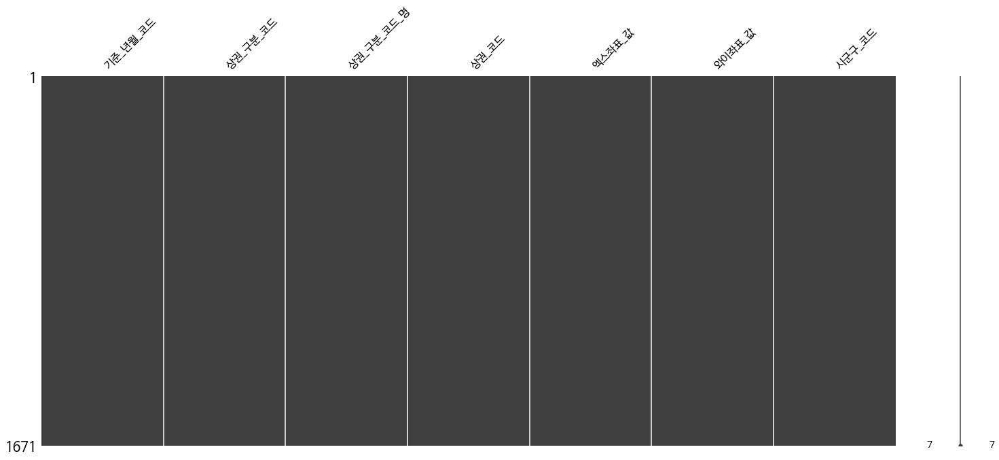

In [ ]:
msno.matrix(commercial_area)

In [ ]:
commercial_info17 = pd.read_csv('./data/commercial_info_2017.csv')
commercial_info18 = pd.read_csv('./data/commercial_info_2018.csv')
commercial_info19 = pd.read_csv('./data/commercial_info_2019.csv')
commercial_info20 = pd.read_csv('./data/commercial_info_2020.csv')

### - 2020년

In [ ]:
commercial_info20

,상호명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,시군구코드,시군구명,행정동코드,행정동명,법정동코드,법정동명,경도,위도
0,도전최강달인왕만두,Q,음식,Q01,한식,Q01A01,한식/백반/한정식,11740,강동구,1174056000,고덕2동,1174010200,고덕동,127.159471,37.556197
1,이때,Q,음식,Q01,한식,Q01A01,한식/백반/한정식,11440,마포구,1144071000,연남동,1144012400,연남동,126.924660,37.562176
2,L.A.D,Q,음식,Q01,한식,Q01A01,한식/백반/한정식,11440,마포구,1144066000,서교동,1144012000,서교동,126.919845,37.550689
3,제이씨에스푸드,Q,음식,Q01,한식,Q01A01,한식/백반/한정식,11620,관악구,1162066500,서림동,1162010200,신림동,126.937790,37.471190
4,BYC상신점,D,소매,D05,의복의류,D05A07,셔츠/내의/속옷,11710,송파구,1171053200,거여2동,1171011300,거여동,127.147321,37.493054
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346572,현대기림,D,소매,D10,건강/미용식품,D10A04,건강식품판매,11200,성동구,1120065000,성수1가1동,1120011400,성수동1가,127.051154,37.539464
346573,본현대미아점,D,소매,D10,건강/미용식품,D10A04,건강식품판매,11290,성북구,1129068500,길음2동,1129013400,길음동,127.028726,37.608392
346574,오피스알파,D,소매,D10,건강/미용식품,D10A04,건강식품판매,11305,강북구,1130563500,수유3동,1130510300,수유동,127.018733,37.640485
346575,앤클라인뉴욕핸드백,D,소매,D06,가방/신발/액세서리,D06A10,가방/가죽제품소매,11530,구로구,1153056000,구로5동,1153010200,구로동,126.882409,37.501378


In [ ]:
commercial_info20.isnull().sum()

상호명          1
상권업종대분류코드    0
상권업종대분류명     0
상권업종중분류코드    0
상권업종중분류명     0
상권업종소분류코드    0
상권업종소분류명     0
시군구코드        0
시군구명         0
행정동코드        0
행정동명         0
법정동코드        0
법정동명         0
경도           0
위도           0
dtype: int64

In [ ]:
commercial_info20[commercial_info20['상호명'].isnull()]

,상호명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,시군구코드,시군구명,행정동코드,행정동명,법정동코드,법정동명,경도,위도
99659,NaN,Q,음식,Q01,한식,Q01A01,한식/백반/한정식,11140,중구,1114060500,을지로동,1114015000,을지로4가,126.996415,37.566908


In [ ]:
commercial_info20 = commercial_info20.drop(index=[99659])
commercial_info20.isnull().sum()

상호명          0
상권업종대분류코드    0
상권업종대분류명     0
상권업종중분류코드    0
상권업종중분류명     0
상권업종소분류코드    0
상권업종소분류명     0
시군구코드        0
시군구명         0
행정동코드        0
행정동명         0
법정동코드        0
법정동명         0
경도           0
위도           0
dtype: int64

### - 2019년

In [ ]:
commercial_info19

,상호명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,시군구코드,시군구명,행정동코드,행정동명,법정동코드,법정동명,경도,위도
0,와라와라호프,Q,음식,Q09,유흥주점,Q09A01,호프/맥주,11680,강남구,1168060000,대치1동,1168010600,대치동,127.061026,37.493922
1,커피빈코리아선릉로93길점,Q,음식,Q12,커피점/카페,Q12A01,커피전문점/카페/다방,11680,강남구,1168064000,역삼1동,1168010100,역삼동,127.047883,37.505675
2,프로포즈,Q,음식,Q09,유흥주점,Q09A01,호프/맥주,11545,금천구,1154563000,독산3동,1154510200,독산동,126.899220,37.471711
3,가락사우나내스낵,F,생활서비스,F09,대중목욕탕/휴게,F09A02,사우나/증기탕/온천,11710,송파구,1171060000,석촌동,1171010500,석촌동,127.104071,37.500249
4,초밥왕,Q,음식,Q03,일식/수산물,Q03A03,음식점-초밥전문,11710,송파구,1171071000,잠실6동,1171010200,신천동,127.102490,37.515149
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
407371,비파티세리공덕,Q,음식,Q01,한식,Q01A01,한식/백반/한정식,11440,마포구,1144056500,공덕동,1144010200,공덕동,126.955059,37.548618
407372,앤탑PC방,N,관광/여가/오락,N01,PC/오락/당구/볼링등,N01A01,인터넷PC방,11200,성동구,1120069000,성수2가3동,1120011500,성수동2가,127.054615,37.545853
407373,오즈아레나PC방,N,관광/여가/오락,N01,PC/오락/당구/볼링등,N01A01,인터넷PC방,11680,강남구,1168052100,논현1동,1168010800,논현동,127.024102,37.506202
407374,파인트리네일,F,생활서비스,F01,이/미용/건강,F01A02,발/네일케어,11560,영등포구,1156054000,여의동,1156011000,여의도동,126.924863,37.525172


In [ ]:
commercial_info19.isnull().sum()

상호명          0
상권업종대분류코드    0
상권업종대분류명     0
상권업종중분류코드    0
상권업종중분류명     0
상권업종소분류코드    0
상권업종소분류명     0
시군구코드        0
시군구명         0
행정동코드        0
행정동명         0
법정동코드        0
법정동명         0
경도           0
위도           0
dtype: int64

### - 2018년

In [ ]:
commercial_info18

,상호명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,시군구코드,시군구명,행정동코드,행정동명,법정동코드,법정동명,경도,위도
0,와라와라호프,Q,음식,Q09,유흥주점,Q09A01,호프/맥주,11680,강남구,1168060000,대치1동,1168010600,대치동,127.061026,37.493922
1,커피빈코리아선릉로93길점,Q,음식,Q12,커피점/카페,Q12A01,커피전문점/카페/다방,11680,강남구,1168064000,역삼1동,1168010100,역삼동,127.047883,37.505675
2,프로포즈,Q,음식,Q09,유흥주점,Q09A01,호프/맥주,11545,금천구,1154563000,독산3동,1154510200,독산동,126.899220,37.471711
3,가락사우나내스낵,F,생활서비스,F09,대중목욕탕/휴게,F09A02,사우나/증기탕/온천,11710,송파구,1171060000,석촌동,1171010500,석촌동,127.104071,37.500249
4,허술한집,Q,음식,Q04,분식,Q04A01,라면김밥분식,11500,강서구,1150062000,공항동,1150010800,공항동,126.809957,37.562013
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
345263,배스킨라빈스31,Q,음식,Q07,패스트푸드,Q07A07,아이스크림판매,11215,광진구,1121584000,자양3동,1121510500,자양동,127.072944,37.536997
345264,본도시락,Q,음식,Q01,한식,Q01A09,설렁탕집,11740,강동구,1174051500,강일동,1174010300,상일동,127.175331,37.549794
345265,체크페이먼트,Q,음식,Q12,커피점/카페,Q12A01,커피전문점/카페/다방,11680,강남구,1168063000,대치4동,1168010600,대치동,127.054001,37.502210
345266,마젠타네일,F,생활서비스,F01,이/미용/건강,F01A02,발/네일케어,11440,마포구,1144055500,아현동,1144010200,공덕동,126.954442,37.549892


In [ ]:
commercial_info18.isnull().sum()

상호명          0
상권업종대분류코드    0
상권업종대분류명     0
상권업종중분류코드    0
상권업종중분류명     0
상권업종소분류코드    0
상권업종소분류명     0
시군구코드        0
시군구명         0
행정동코드        0
행정동명         0
법정동코드        0
법정동명         0
경도           0
위도           0
dtype: int64

### - 2017년

In [ ]:
commercial_info17

,Column,상호명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,시군구코드,시군구명,행정동코드,행정동명,법정동코드,법정동명,경도,위도
0,0,커피빈코리아선릉로93길점,Q,음식,Q12,커피점/카페,Q12A01,커피전문점/카페/다방,11680,강남구,1.168064e+09,역삼1동,1168010100,역삼동,127.047883,37.505675
1,1,프로포즈,Q,음식,Q09,유흥주점,Q09A01,호프/맥주,11545,금천구,1.154563e+09,독산3동,1154510200,독산동,126.899220,37.471711
2,3,와라와라호프,Q,음식,Q09,유흥주점,Q09A01,호프/맥주,11680,강남구,1.168060e+09,대치1동,1168010600,대치동,127.061026,37.493922
3,4,가락사우나내스낵,F,생활서비스,F09,대중목욕탕/휴게,F09A02,사우나/증기탕/온천,11710,송파구,1.171060e+09,석촌동,1171010500,석촌동,127.104071,37.500249
4,5,허술한집,Q,음식,Q04,분식,Q04A01,라면김밥분식,11500,강서구,1.150062e+09,공항동,1150010800,공항동,126.809957,37.562013
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
321431,464404,이로운퍼스널트레이닝스튜디오2,P,스포츠,P02,실내운동시설,P02A13,헬스클럽,11230,동대문구,1.123054e+09,용신동,1123010200,용두동,127.039029,37.576029
321432,464405,제이와이휘트니스,P,스포츠,P02,실내운동시설,P02A13,헬스클럽,11500,강서구,1.150054e+09,화곡1동,1150010300,화곡동,126.838531,37.537618
321433,464407,케이복싱킥복싱,P,스포츠,P02,실내운동시설,P02A18,킥복싱,11590,동작구,1.159067e+09,신대방1동,1159010900,신대방동,126.908740,37.487207
321434,464408,원탑스크린골프,P,스포츠,P02,실내운동시설,P02A10,실내골프연습장,11710,송파구,1.171057e+09,오금동,1171011200,오금동,127.142092,37.501369


In [ ]:
commercial_info17.isnull().sum()

Column       0
상호명          0
상권업종대분류코드    0
상권업종대분류명     0
상권업종중분류코드    0
상권업종중분류명     0
상권업종소분류코드    0
상권업종소분류명     0
시군구코드        0
시군구명         0
행정동코드        0
행정동명         0
법정동코드        0
법정동명         0
경도           0
위도           0
dtype: int64

In [ ]:
# 컬럼이 안맞아서 맨 앞을 제거
commercial_info17 = commercial_info17.drop(['Column'], axis=1)
commercial_info17

,상호명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,시군구코드,시군구명,행정동코드,행정동명,법정동코드,법정동명,경도,위도
0,커피빈코리아선릉로93길점,Q,음식,Q12,커피점/카페,Q12A01,커피전문점/카페/다방,11680,강남구,1.168064e+09,역삼1동,1168010100,역삼동,127.047883,37.505675
1,프로포즈,Q,음식,Q09,유흥주점,Q09A01,호프/맥주,11545,금천구,1.154563e+09,독산3동,1154510200,독산동,126.899220,37.471711
2,와라와라호프,Q,음식,Q09,유흥주점,Q09A01,호프/맥주,11680,강남구,1.168060e+09,대치1동,1168010600,대치동,127.061026,37.493922
3,가락사우나내스낵,F,생활서비스,F09,대중목욕탕/휴게,F09A02,사우나/증기탕/온천,11710,송파구,1.171060e+09,석촌동,1171010500,석촌동,127.104071,37.500249
4,허술한집,Q,음식,Q04,분식,Q04A01,라면김밥분식,11500,강서구,1.150062e+09,공항동,1150010800,공항동,126.809957,37.562013
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
321431,이로운퍼스널트레이닝스튜디오2,P,스포츠,P02,실내운동시설,P02A13,헬스클럽,11230,동대문구,1.123054e+09,용신동,1123010200,용두동,127.039029,37.576029
321432,제이와이휘트니스,P,스포츠,P02,실내운동시설,P02A13,헬스클럽,11500,강서구,1.150054e+09,화곡1동,1150010300,화곡동,126.838531,37.537618
321433,케이복싱킥복싱,P,스포츠,P02,실내운동시설,P02A18,킥복싱,11590,동작구,1.159067e+09,신대방1동,1159010900,신대방동,126.908740,37.487207
321434,원탑스크린골프,P,스포츠,P02,실내운동시설,P02A10,실내골프연습장,11710,송파구,1.171057e+09,오금동,1171011200,오금동,127.142092,37.501369


In [ ]:
# 행정동코드 실수 타입을 int로 다시 전환
commercial_info17['행정동코드'] = commercial_info17['행정동코드'].astype(int)

In [ ]:
commercial_info17

,상호명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,시군구코드,시군구명,행정동코드,행정동명,법정동코드,법정동명,경도,위도
0,커피빈코리아선릉로93길점,Q,음식,Q12,커피점/카페,Q12A01,커피전문점/카페/다방,11680,강남구,1168064000,역삼1동,1168010100,역삼동,127.047883,37.505675
1,프로포즈,Q,음식,Q09,유흥주점,Q09A01,호프/맥주,11545,금천구,1154563000,독산3동,1154510200,독산동,126.899220,37.471711
2,와라와라호프,Q,음식,Q09,유흥주점,Q09A01,호프/맥주,11680,강남구,1168060000,대치1동,1168010600,대치동,127.061026,37.493922
3,가락사우나내스낵,F,생활서비스,F09,대중목욕탕/휴게,F09A02,사우나/증기탕/온천,11710,송파구,1171060000,석촌동,1171010500,석촌동,127.104071,37.500249
4,허술한집,Q,음식,Q04,분식,Q04A01,라면김밥분식,11500,강서구,1150062000,공항동,1150010800,공항동,126.809957,37.562013
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
321431,이로운퍼스널트레이닝스튜디오2,P,스포츠,P02,실내운동시설,P02A13,헬스클럽,11230,동대문구,1123053600,용신동,1123010200,용두동,127.039029,37.576029
321432,제이와이휘트니스,P,스포츠,P02,실내운동시설,P02A13,헬스클럽,11500,강서구,1150054000,화곡1동,1150010300,화곡동,126.838531,37.537618
321433,케이복싱킥복싱,P,스포츠,P02,실내운동시설,P02A18,킥복싱,11590,동작구,1159067000,신대방1동,1159010900,신대방동,126.908740,37.487207
321434,원탑스크린골프,P,스포츠,P02,실내운동시설,P02A10,실내골프연습장,11710,송파구,1171057000,오금동,1171011200,오금동,127.142092,37.501369


## - 21년 다시 가져와서 전부 합치기

## - 상권 분석(주 데이터) 시각화


## - 1. 상권 분석 5개년 전체 시각화(8)

-----

Text(0.5, 1.0, '[ - 서울시 연도별 업종 현황 - ]')

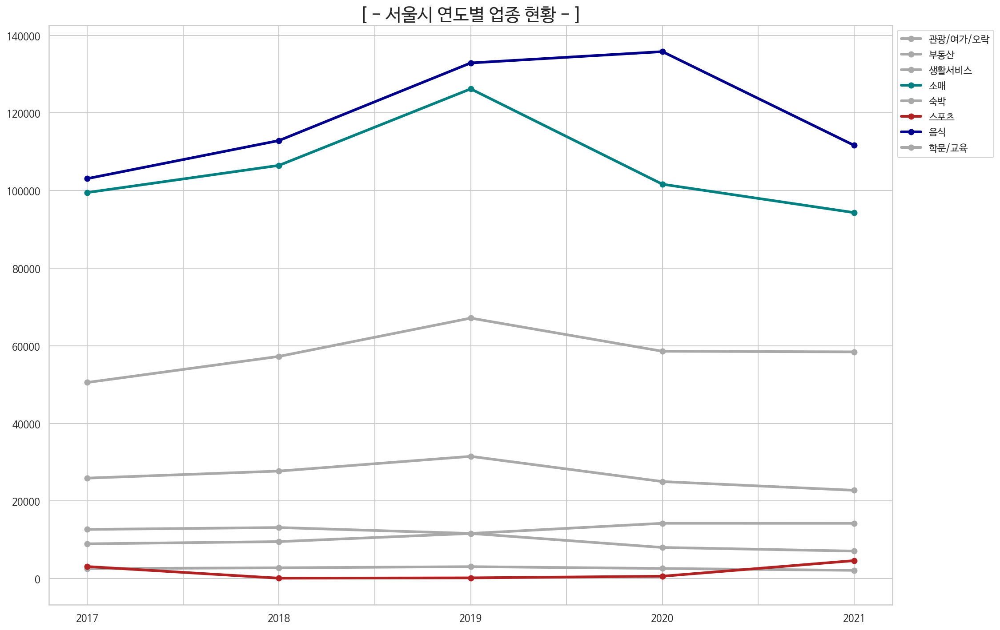

In [ ]:
# 서울시 연도별 업종 현황(선 그래프)
plt.rcParams["figure.figsize"] = (17,12)
colors = ['darkgrey','darkgrey','darkgrey','teal','darkgrey','firebrick','darkblue','darkgrey']
df[['관광/여가/오락', '부동산', '생활서비스', '소매','숙박', '스포츠','음식', '학문/교육']].plot(marker='o', linewidth = "3", color=colors)
plt.legend(loc = 2, bbox_to_anchor = (1,1))
plt.title('[ - 서울시 연도별 업종 현황 - ]', fontsize=20)

Text(0.5, 1.0, '[ - 서울시 연도별 업종 현황 - ]')

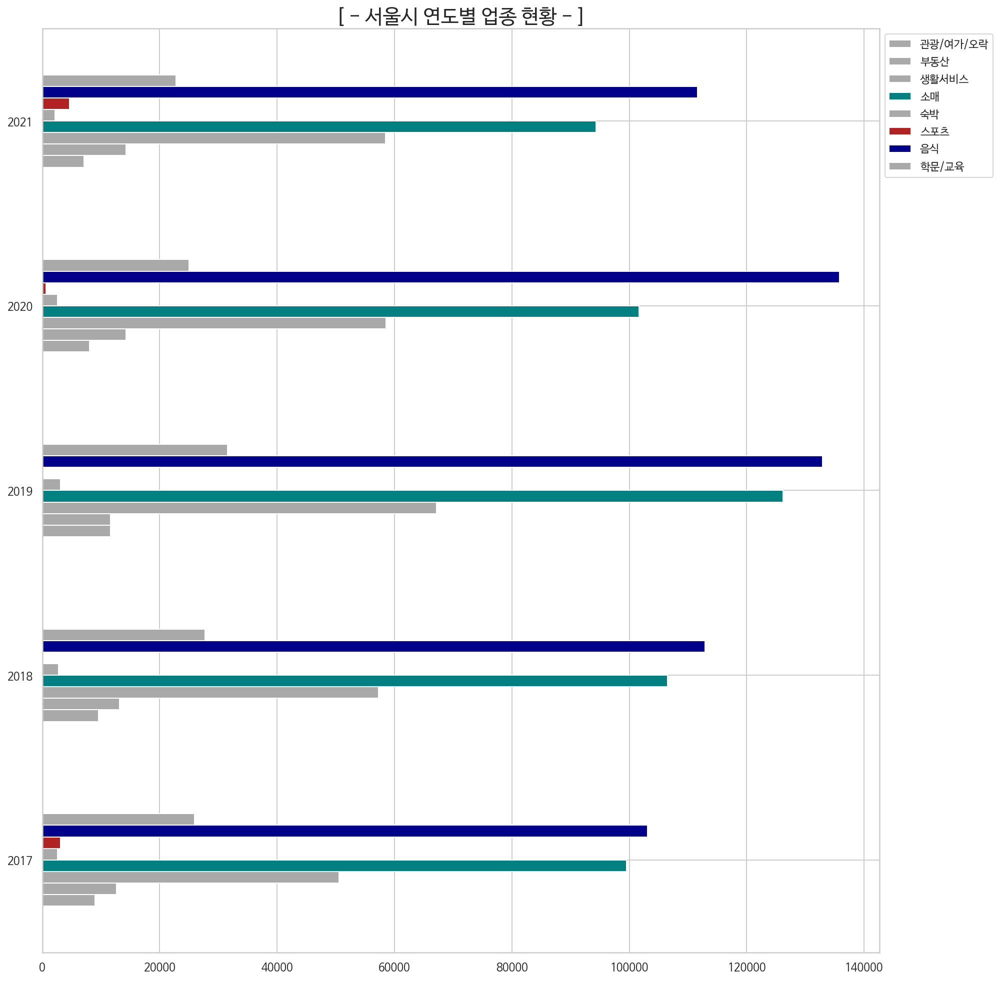

In [ ]:
# 서울시 연도별 업종 현황(바 그래프, 따로)
plt.rcParams["figure.figsize"] = (15,17)
colors = ['darkgrey','darkgrey','darkgrey','teal','darkgrey','firebrick','darkblue','darkgrey']
df.plot(kind='barh', color=colors)
plt.legend(loc = 2, bbox_to_anchor = (1,1))
plt.title('[ - 서울시 연도별 업종 현황 - ]', fontsize=20)

Text(0.5, 1.0, '[ - 서울시 연도별 업종 현황 - ]')

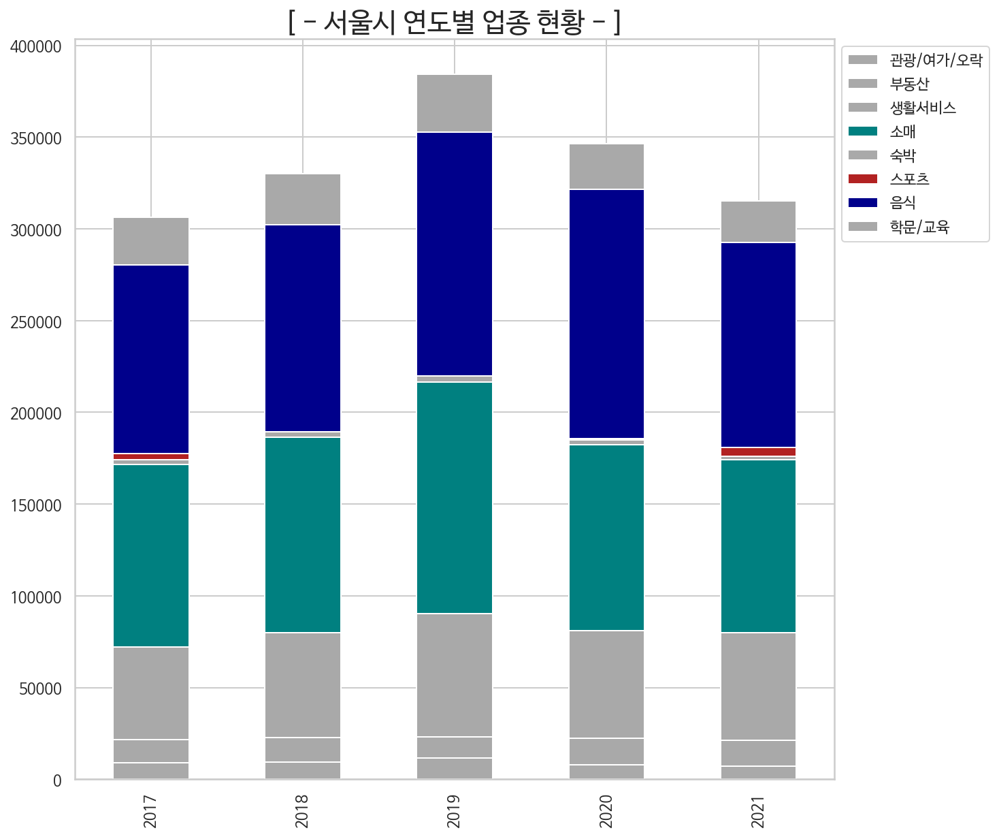

In [ ]:
# 서울시 연도별 업종 현황(누적 그래프, 같이)
plt.rcParams["figure.figsize"] = (10,10)
colors = ['darkgrey','darkgrey','darkgrey','teal','darkgrey','firebrick','darkblue','darkgrey']
df.plot(kind='bar', color=colors, stacked=True)
plt.legend(loc = 2, bbox_to_anchor = (1,1))
plt.title('[ - 서울시 연도별 업종 현황 - ]', fontsize=20)

Text(0.5, 1.0, '[ - 서울시 연도별 스포츠 업종 현황(2017 ~ 2021) - ]')

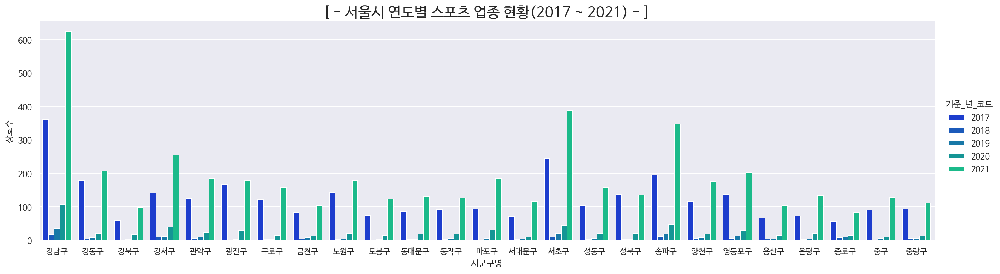

In [ ]:
# 서울시 5개년 스포츠 업종 현황, 바 그래프
plt.rcParams["figure.figsize"] = (20,7)
sns.catplot(x='시군구명', y='상호수', hue='기준_년_코드', kind='bar', data=sports2, aspect=25/7, palette='winter')
plt.title('[ - 서울시 연도별 스포츠 업종 현황(2017 ~ 2021) - ]', fontsize=20)

Text(0.5, 1.0, '[ - 서울시 연도별 음식 업종 현황(2017 ~ 2021) - ]')

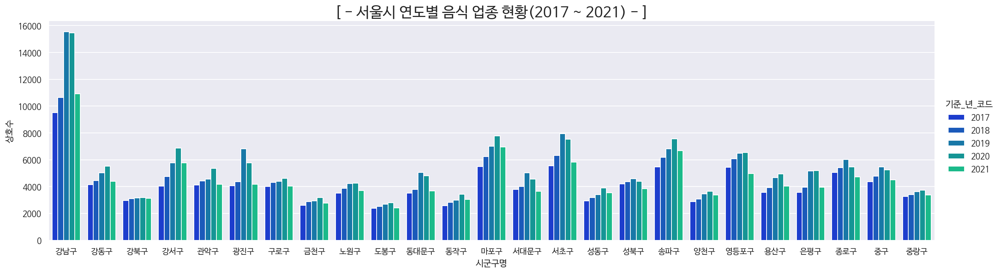

In [ ]:
# 서울시 5개년 음식 업종 현황, 바 그래프
plt.rcParams["figure.figsize"] = (20,7)
sns.catplot(x='시군구명', y='상호수', hue='기준_년_코드', kind='bar', data=food_t2, aspect=25/7, palette='winter')
plt.title('[ - 서울시 연도별 음식 업종 현황(2017 ~ 2021) - ]', fontsize=20)

Text(0.5, 1.0, '[ - 서울시 연도별 소매 업종 현황(2017 ~ 2021) - ]')

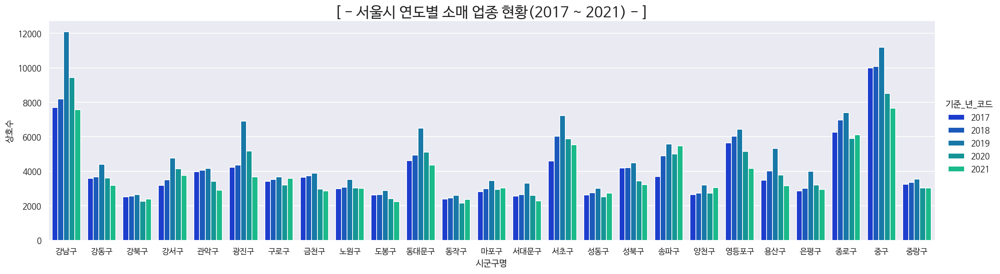

In [ ]:
# 서울시 5개년 소매 업종 현황, 바 그래프
plt.rcParams["figure.figsize"] = (20,7)
sns.catplot(x='시군구명', y='상호수', hue='기준_년_코드', kind='bar', data=retail2, aspect=25/7, palette='winter')
plt.title('[ - 서울시 연도별 소매 업종 현황(2017 ~ 2021) - ]', fontsize=20)

Text(0.5, 1.0, '[ - 서울시 연도별 생활서비스 업종 현황(2017 ~ 2021) - ]')

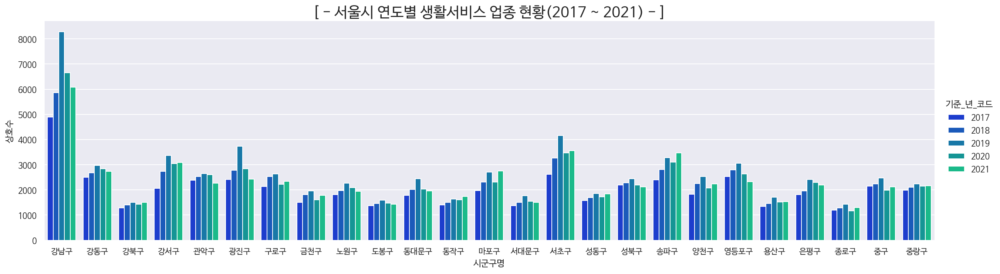

In [ ]:
# 서울시 5개년 생활서비스 업종 현황, 바 그래프
plt.rcParams["figure.figsize"] = (20,7)
sns.catplot(x='시군구명', y='상호수', hue='기준_년_코드', kind='bar', data=lifestyle2, aspect=25/7, palette='winter')
plt.title('[ - 서울시 연도별 생활서비스 업종 현황(2017 ~ 2021) - ]', fontsize=20)

Text(0.5, 1.0, '[ - 서울시 연도별 학문/교육 업종 현황(2017 ~ 2021) - ]')

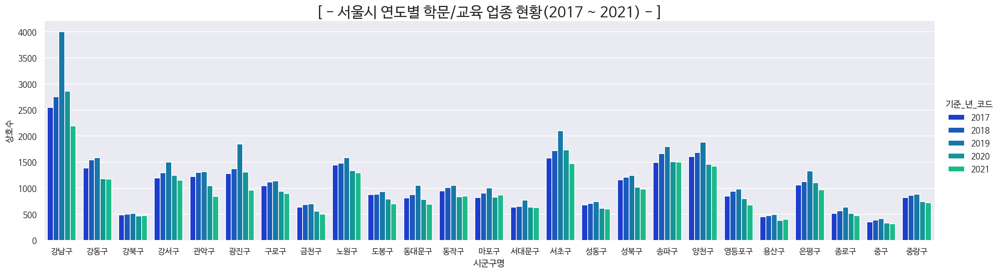

In [ ]:
# 서울시 5개년 교육 업종 현황, 바 그래프
plt.rcParams["figure.figsize"] = (20,7)
sns.catplot(x='시군구명', y='상호수', hue='기준_년_코드', kind='bar', data=education2, aspect=25/7, palette='winter')
plt.title('[ - 서울시 연도별 학문/교육 업종 현황(2017 ~ 2021) - ]', fontsize=20)

<br>
<br>

## - 2. 21년, 19년도 업종 변화 자치구별 비교(8)

-----

Text(0.5, 1.0, '[ - 2021년 자치구별 생활서비스, 스포츠, 음식 업종 점포수 - ]')

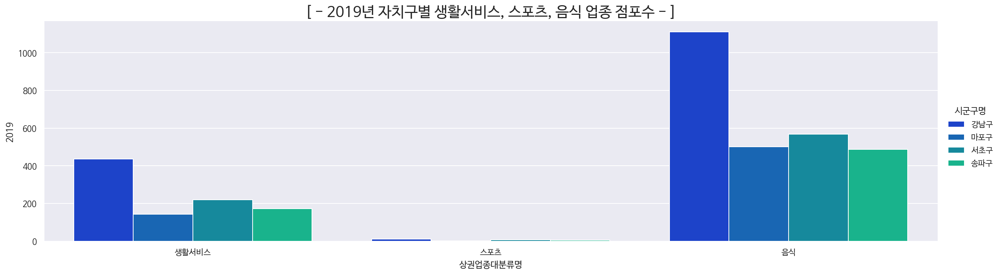

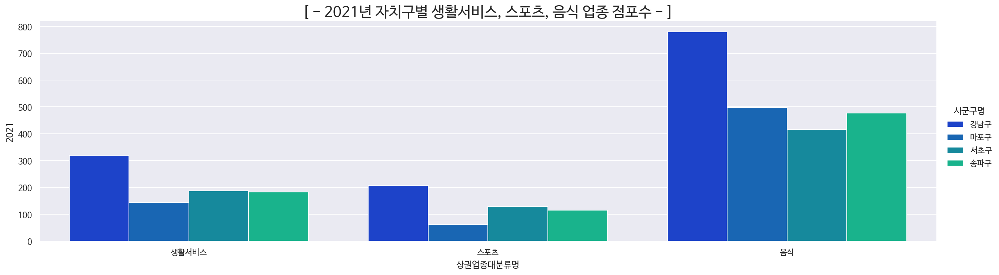

In [ ]:
# 2019년 대분류 업종 변화, 바 그래프
plt.rcParams["figure.figsize"] = (20,7)
sns.catplot(x='상권업종대분류명', y='2019', hue='시군구명', kind='bar', data=merge_1921, aspect=25/7, ci=None, palette='winter')
plt.title('[ - 2019년 자치구별 생활서비스, 스포츠, 음식 업종 점포수 - ]', fontsize=20)
sns.catplot(x='상권업종대분류명', y='2021', hue='시군구명', kind='bar', data=merge_1921, aspect=25/7, ci=None, palette='winter')
plt.title('[ - 2021년 자치구별 생활서비스, 스포츠, 음식 업종 점포수 - ]', fontsize=20)

In [ ]:
# 중분류로 디테일하게 뭐가 늘어났는지 확인하기
c_life = (merge_1921['상권업종대분류명']=='음식')
c_sport = (merge_1921['상권업종대분류명']=='스포츠')
c_food = (merge_1921['상권업종대분류명']=='생활서비스')
merge_1921_life = merge_1921.loc[c_life]
merge_1921_sport = merge_1921.loc[c_sport]
merge_1921_food = merge_1921.loc[c_food]

Text(0.5, 1.0, '[ - 2021년 자치구별 음식 업종 점포수 - ]')

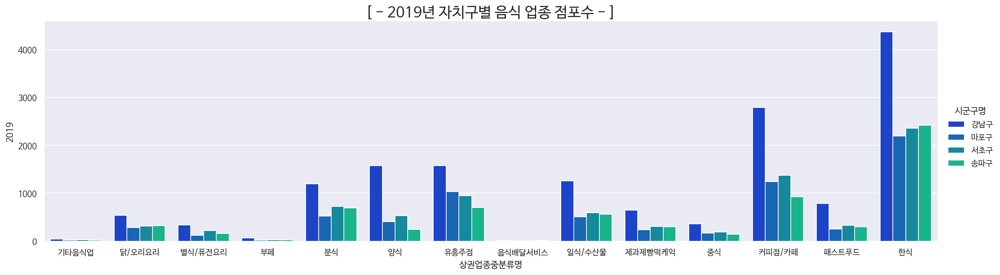

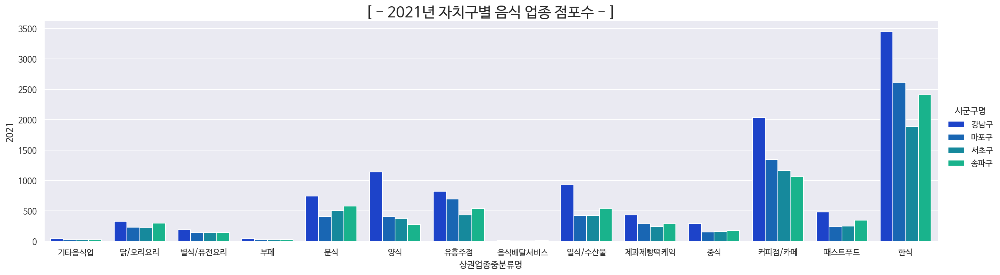

In [ ]:
# 2019, 2021년 생활서비스 업종 변화, 바 그래프
plt.rcParams["figure.figsize"] = (20,7)
sns.catplot(x='상권업종중분류명', y='2019', hue='시군구명', kind='bar', data=merge_1921_life, aspect=25/7, ci=None, palette='winter')
plt.title('[ - 2019년 자치구별 음식 업종 점포수 - ]', fontsize=20)
sns.catplot(x='상권업종중분류명', y='2021', hue='시군구명', kind='bar', data=merge_1921_life, aspect=25/7, ci=None, palette='winter')
plt.title('[ - 2021년 자치구별 음식 업종 점포수 - ]', fontsize=20)

Text(0.5, 1.0, '[ - 2021년 자치구별 생활서비스 업종 점포수 - ]')

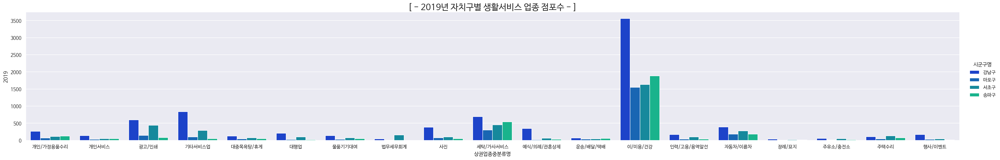

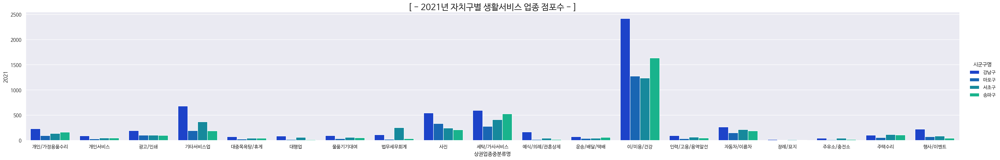

In [ ]:
# 2019, 2021년 음식 업종 변화, 바 그래프
plt.rcParams["figure.figsize"] = (25,7)
sns.catplot(x='상권업종중분류명', y='2019', hue='시군구명', kind='bar', data=merge_1921_food, aspect=25/4, ci=None, palette='winter')
plt.title('[ - 2019년 자치구별 생활서비스 업종 점포수 - ]', fontsize=20)
sns.catplot(x='상권업종중분류명', y='2021', hue='시군구명', kind='bar', data=merge_1921_food, aspect=25/4, ci=None, palette='winter')
plt.title('[ - 2021년 자치구별 생활서비스 업종 점포수 - ]', fontsize=20)

Text(0.5, 1.0, '[ - 2021년 자치구별 스포츠 업종 점포수 - ]')

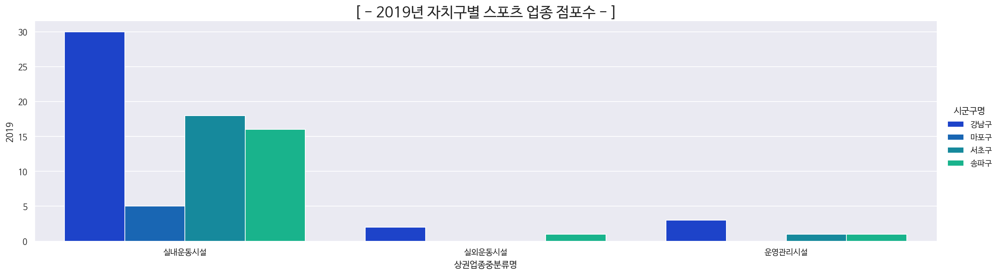

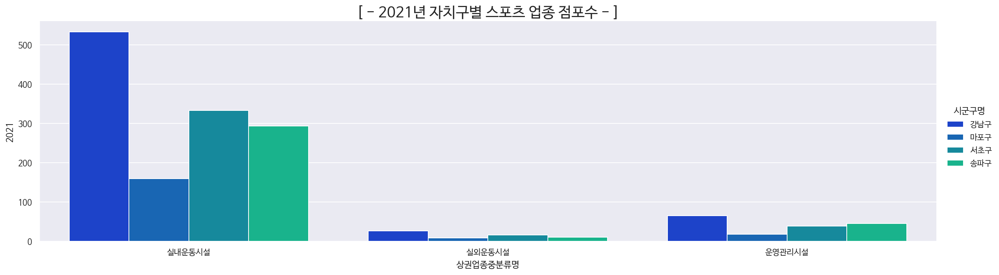

In [ ]:
# 2019, 2021년 스포츠 업종 변화, 바 그래프
plt.rcParams["figure.figsize"] = (20,7)
sns.catplot(x='상권업종중분류명', y='2019', hue='시군구명', kind='bar', data=merge_1921_sport, aspect=25/7, ci=None, palette='winter')
plt.title('[ - 2019년 자치구별 스포츠 업종 점포수 - ]', fontsize=20)
plt.rcParams["figure.figsize"] = (20,7)
sns.catplot(x='상권업종중분류명', y='2021', hue='시군구명', kind='bar', data=merge_1921_sport, aspect=25/7, ci=None, palette='winter')
plt.title('[ - 2021년 자치구별 스포츠 업종 점포수 - ]', fontsize=20)

<br>
<br>

## - 3. 상권 분석 2021년 중점 시각화(9)

-----

Text(0.5, 1.0, '[ - 서울시 업종별 현황 통계(2021) - ]')

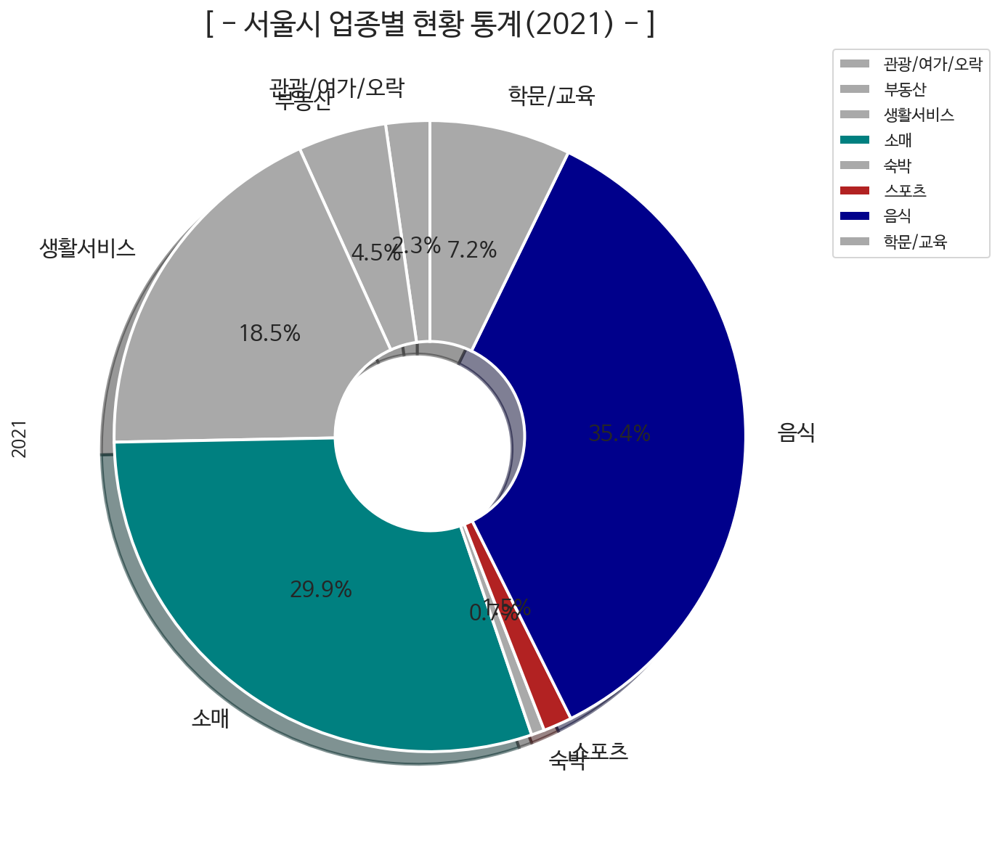

In [ ]:
# 서울시 업종별 현황 통기(2021), 다른 년도들은 다 비슷해서 따로 기입하지 않음(원 그래프)
colors = ['darkgrey','darkgrey','darkgrey','teal','darkgrey','firebrick','darkblue','darkgrey']
wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 2}
df.loc['2021'].plot(kind='pie', figsize=(18,10), startangle = 90, autopct='%1.1f%%',
                    legend = True, colors = colors, shadow=True, textprops={'size':15}, wedgeprops=wedgeprops)
plt.legend(loc = 2, bbox_to_anchor = (1,1))
plt.title('[ - 서울시 업종별 현황 통계(2021) - ]', fontsize=20)

Text(0.5, 1.0, '[ - 서울시 업종별 현황 통계(2021) - ]')

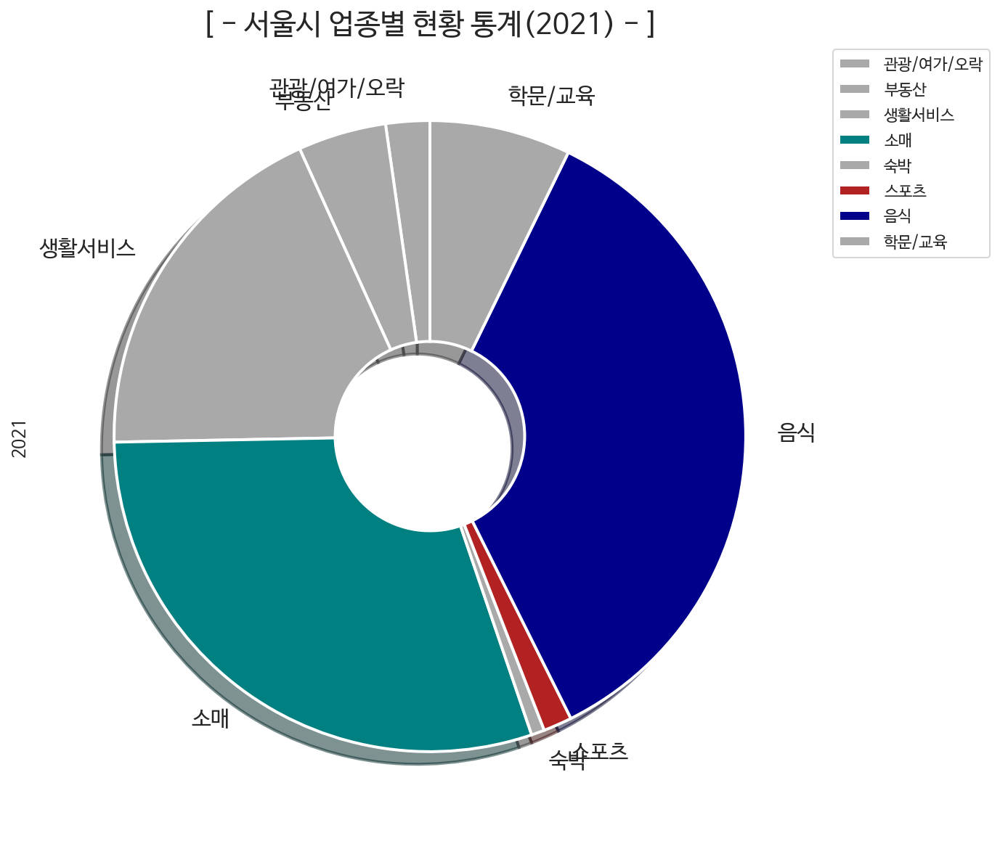

In [ ]:
# 서울시 업종별 현황 통기(2021), 다른 년도들은 다 비슷해서 따로 기입하지 않음(원 그래프)
colors = ['darkgrey','darkgrey','darkgrey','teal','darkgrey','firebrick','darkblue','darkgrey']
wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 2}
df.loc['2021'].plot(kind='pie', figsize=(18,10), startangle = 90,
                    legend = True, colors = colors, shadow=True, textprops={'size':15}, wedgeprops=wedgeprops)
plt.legend(loc = 2, bbox_to_anchor = (1,1))
plt.title('[ - 서울시 업종별 현황 통계(2021) - ]', fontsize=20)

Text(0.5, 1.0, '[ - 서울 음식점 자치구별 통계(2021) - ]')

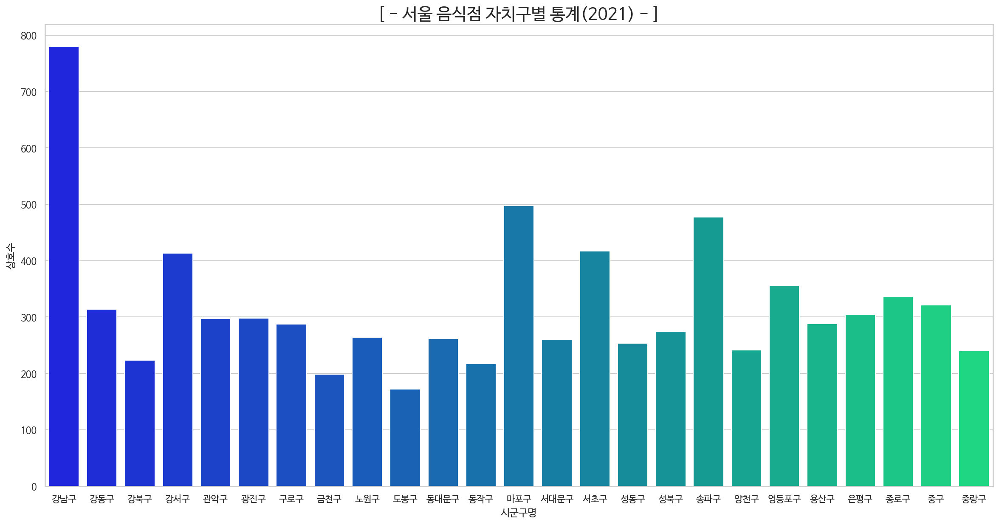

In [ ]:
# 서울시 음식점 자치구별 통계(2017), 바 그래프
plt.rcParams["figure.figsize"] = (20,10)
sns.barplot(data=food, x='시군구명', y='상호수', ci=None, palette='winter')
plt.title('[ - 서울 음식점 자치구별 통계(2021) - ]', fontsize=20)

Text(0.5, 1.0, '[ - 서울 음식점 업종별 통계(2021) - ]')

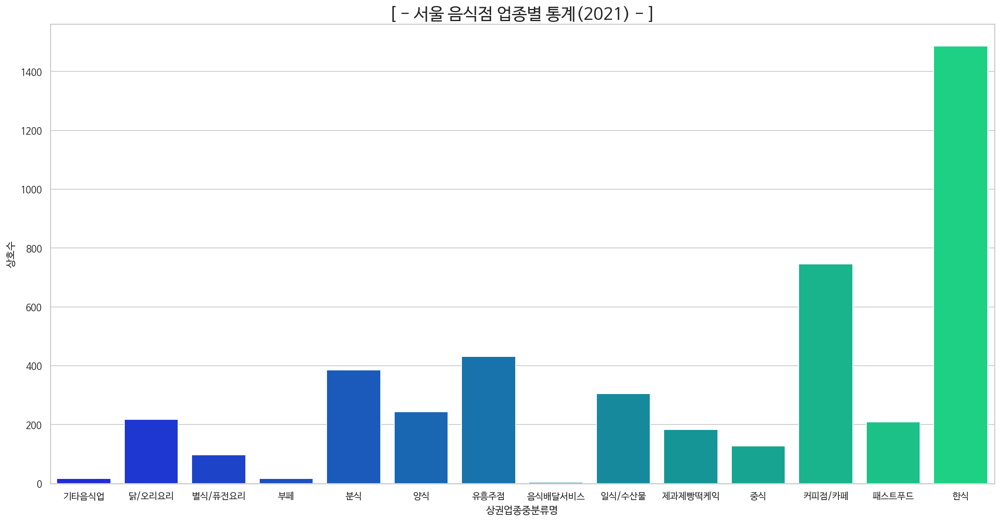

In [ ]:
# 서울시 음식점 업종별 통계(2021), 바 그래프
plt.rcParams["figure.figsize"] = (20,10)
sns.barplot(data=food, x='상권업종중분류명', y='상호수', ci=None, palette='winter')
plt.title('[ - 서울 음식점 업종별 통계(2021) - ]', fontsize=20)

Text(0.5, 1.0, '[ - 강남구 음식점 업종별 통계(2021) - ]')

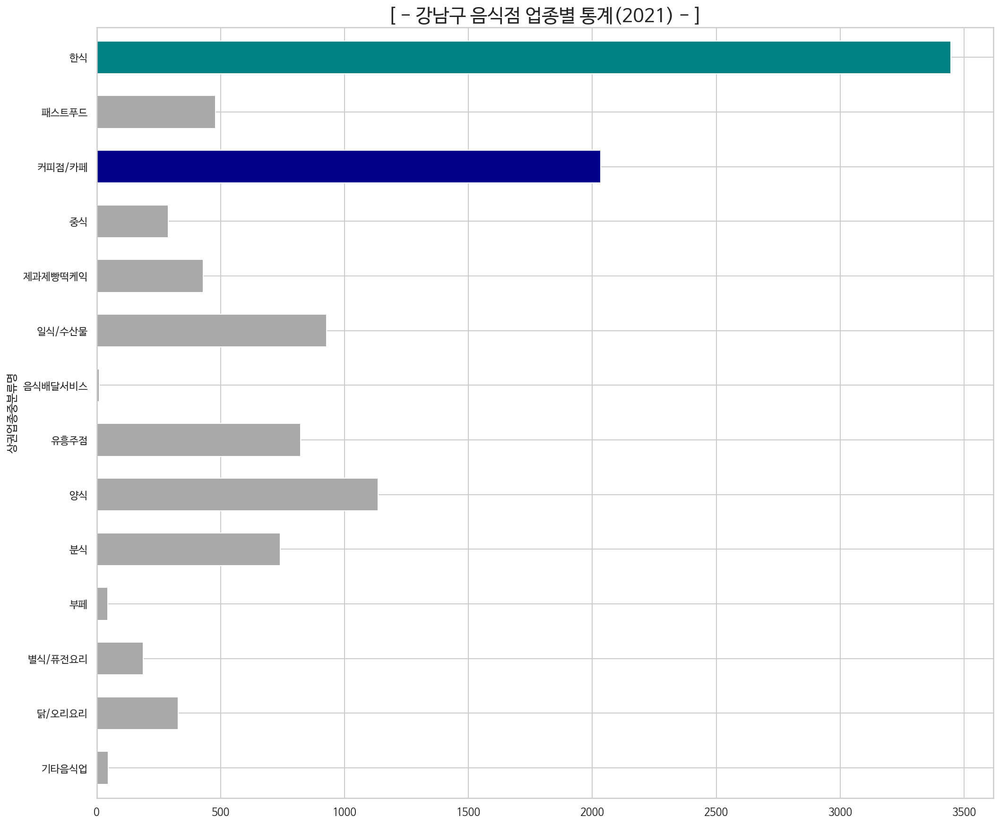

In [ ]:
# 강남구 음식점 업종별 통계(2017), 가로 막대그래프
plt.rcParams["figure.figsize"] = (17,15)
colors = ['darkgrey', 'darkgrey', 'darkgrey', 'darkgrey', 'darkgrey', 'darkgrey', 'darkgrey', 'darkgrey', 'darkgrey',
          'darkgrey', 'darkgrey', 'darkblue', 'darkgrey','teal']
food_gu.unstack().loc['강남구'].plot(kind='barh', stacked = True, align = 'center', width = 0.6,
                                      color = colors)
plt.title('[ - 강남구 음식점 업종별 통계(2021) - ]', fontsize=20)

Text(0.5, 1.0, '[ - 자치구별 학문/교육 분야 통계(2021) - ]')

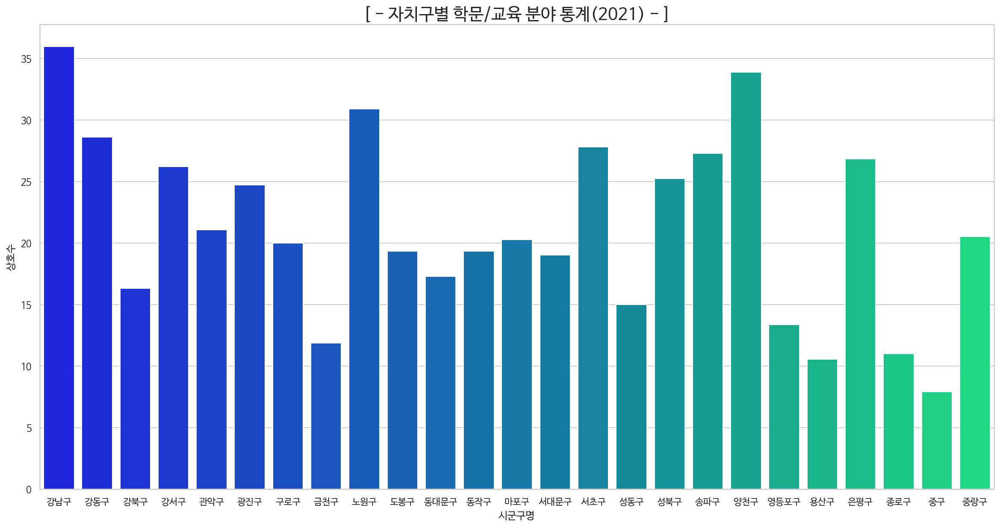

In [ ]:
# 서울시 자치구별 학문/교육 분야 통계(2021), 바 그래프
plt.rcParams["figure.figsize"] = (20,10)
sns.barplot(data=t, x='시군구명', y='상호수', ci=None,  palette='winter')
plt.title('[ - 자치구별 학문/교육 분야 통계(2021) - ]', fontsize=20)

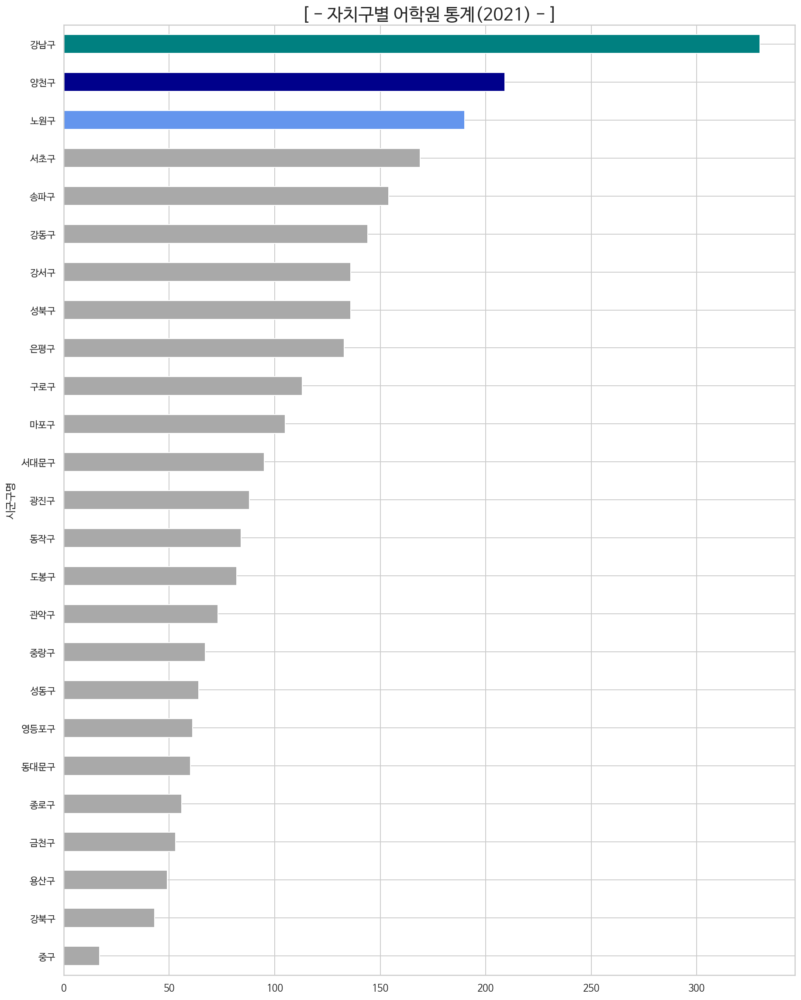

In [ ]:
# 서울시 자치구별 어학원 통계(2017), 바 그래프
colors = ['darkgrey','darkgrey','darkgrey','darkgrey','darkgrey','darkgrey','darkgrey','darkgrey','darkgrey','darkgrey',
          'darkgrey','darkgrey','darkgrey','darkgrey','darkgrey','darkgrey','darkgrey','darkgrey','darkgrey','darkgrey',
          'darkgrey','darkgrey','cornflowerblue','darkblue','teal']
plt.title('[ - 자치구별 어학원 통계(2021) - ]', fontsize=20)
g.loc['학원-외국어/어학'].sort_values().plot.barh(figsize=(15, 20), color=colors)

Text(0.5, 1.0, '[ - 자치구별 소매 분야 통계(2021) - ]')

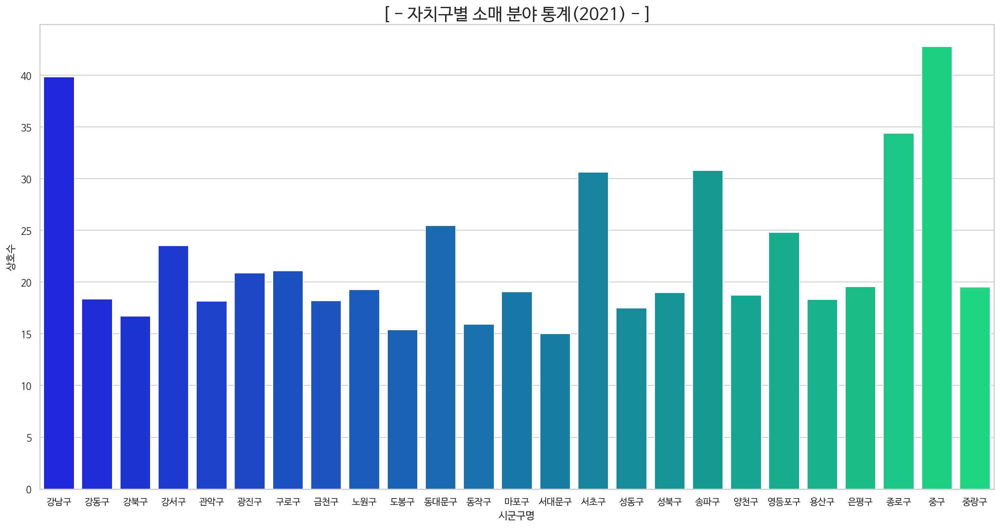

In [ ]:
# 서울시 자치구별 소매 분야 통계(2021), 바 그래프
plt.rcParams["figure.figsize"] = (20,10)
sns.barplot(data=retail2021, x='시군구명', y='상호수', ci=None,  palette='winter')
plt.title('[ - 자치구별 소매 분야 통계(2021) - ]', fontsize=20)

Text(0.5, 1.0, '[ - 자치구별 생활서비스 분야 통계(2021) - ]')

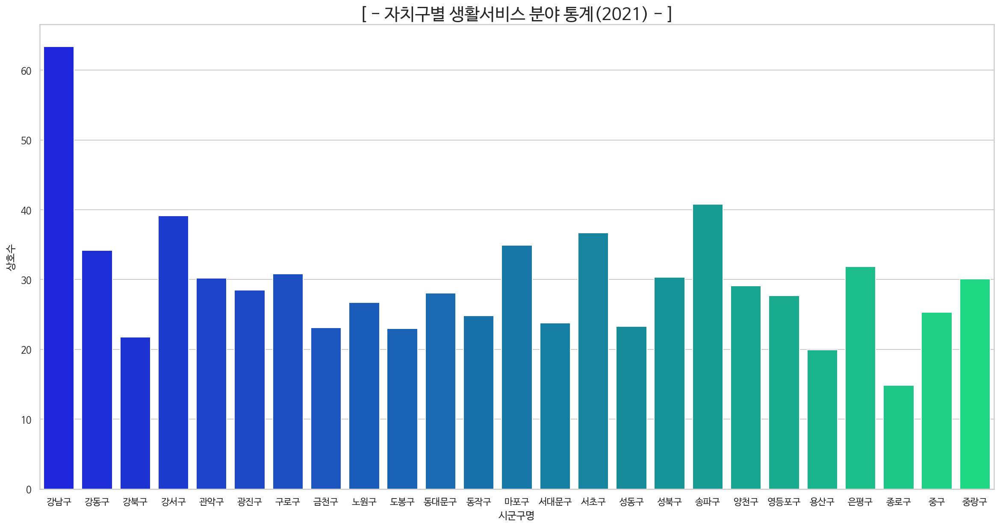

In [ ]:
# 서울시 자치구별 생활서비스 분야 통계(2021), 바 그래프
plt.rcParams["figure.figsize"] = (20,10)
sns.barplot(data=life2021, x='시군구명', y='상호수', ci=None,  palette='winter')
plt.title('[ - 자치구별 생활서비스 분야 통계(2021) - ]', fontsize=20)

Text(0.5, 1.0, '[ - 자치구별 스포츠 분야 통계(2021) - ]')

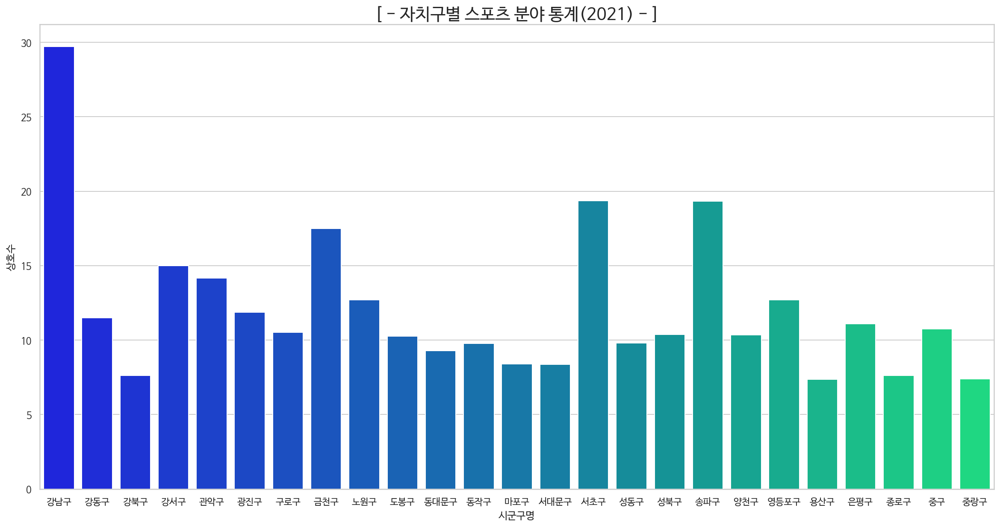

In [ ]:
# 서울시 자치구별 스포츠 분야 통계(2021), 바 그래프
plt.rcParams["figure.figsize"] = (20,10)
sns.barplot(data=sport2021, x='시군구명', y='상호수', ci=None,  palette='winter')
plt.title('[ - 자치구별 스포츠 분야 통계(2021) - ]', fontsize=20)

Text(0.5, 1.0, '[ - 강남구 스포츠 업종별 통계(2021) - ]')

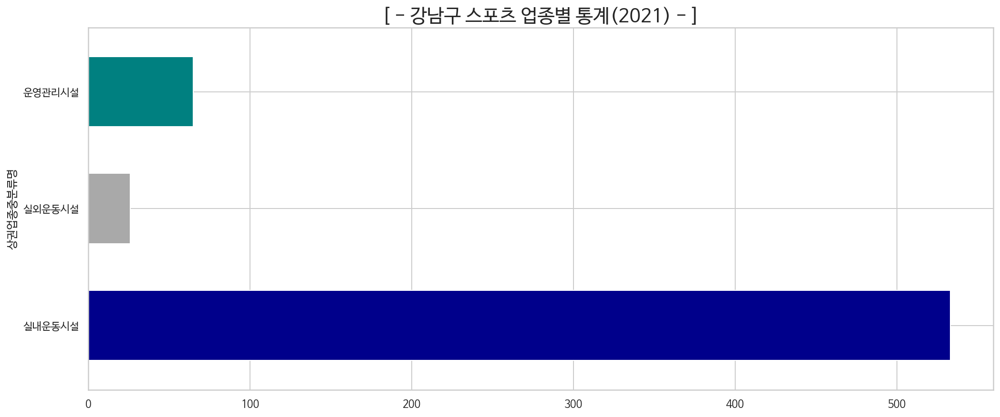

In [ ]:
# 강남구 스포츠 업종별 통계(2017), 가로 막대그래프
plt.rcParams["figure.figsize"] = (17,7)
colors = ['darkblue', 'darkgrey', 'teal']
sport_gu.unstack().loc['강남구'].plot(kind='barh', stacked = True, align = 'center', width = 0.6,
                                      color = colors)
plt.title('[ - 강남구 스포츠 업종별 통계(2021) - ]', fontsize=20)

## - 상권 분석 5개년 메인 파일 공유 코드

In [ ]:
commercial_info = pd.read_csv('./data/commercial_info_total.csv')

In [ ]:
# 기준 년도대로 데이터 분리
condition17 = (commercial_test3['기준_년_코드'] == 2017)
condition18 = (commercial_test3['기준_년_코드'] == 2018)
condition19 = (commercial_test3['기준_년_코드'] == 2019)
condition20 = (commercial_test3['기준_년_코드'] == 2020)
condition21 = (commercial_test3['기준_년_코드'] == 2021)
commercial_2017 = commercial_test3.loc[condition17] # 2017년 파일
commercial_2018 = commercial_test3.loc[condition18] # 2018년 파일
commercial_2019 = commercial_test3.loc[condition19] # 2019년 파일
commercial_2020 = commercial_test3.loc[condition20] # 2020년 파일
commercial_2021 = commercial_test3.loc[condition21] # 2021년 파일

In [ ]:
# 전체 5개년 중에서 이렇게 1년씩으로 나뉩니다
commercial_2017

,기준_년_코드,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시군구명,행정동명
0,2017,커피빈코리아선릉로93길점,음식,커피점/카페,커피전문점/카페/다방,강남구,역삼1동
1,2017,프로포즈,음식,유흥주점,호프/맥주,금천구,독산3동
2,2017,와라와라호프,음식,유흥주점,호프/맥주,강남구,대치1동
3,2017,가락사우나내스낵,생활서비스,대중목욕탕/휴게,사우나/증기탕/온천,송파구,석촌동
4,2017,허술한집,음식,분식,라면김밥분식,강서구,공항동
...,...,...,...,...,...,...,...
321431,2017,이로운퍼스널트레이닝스튜디오2,스포츠,실내운동시설,헬스클럽,동대문구,용신동
321432,2017,제이와이휘트니스,스포츠,실내운동시설,헬스클럽,강서구,화곡1동
321433,2017,케이복싱킥복싱,스포츠,실내운동시설,킥복싱,동작구,신대방1동
321434,2017,원탑스크린골프,스포츠,실내운동시설,실내골프연습장,송파구,오금동


<br>
<br>

-----


<br>
<br>

-----
## - 매출,소비,인구,상권변화 시각화(10)

Text(0.5, 1.0, '[ - 서울시 자치구별 총 소비 현황(음식) - ]')

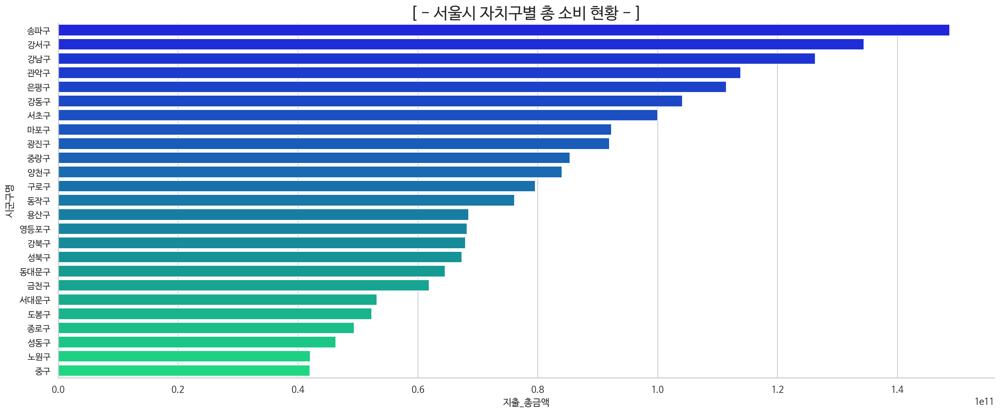

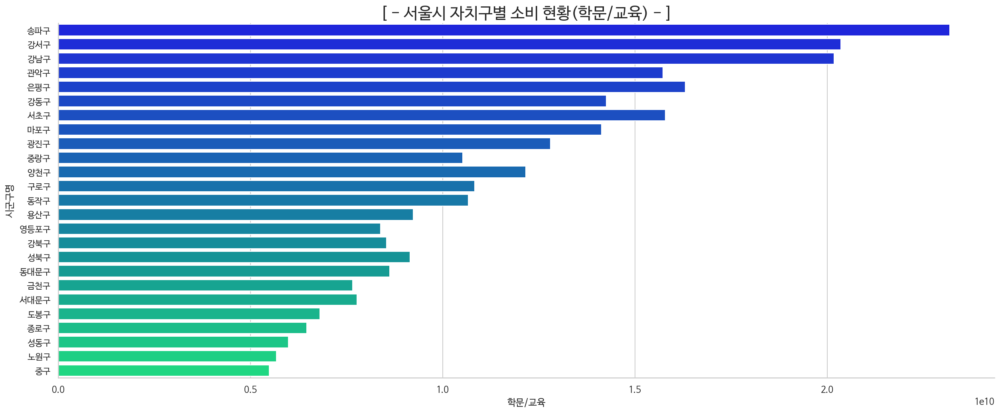

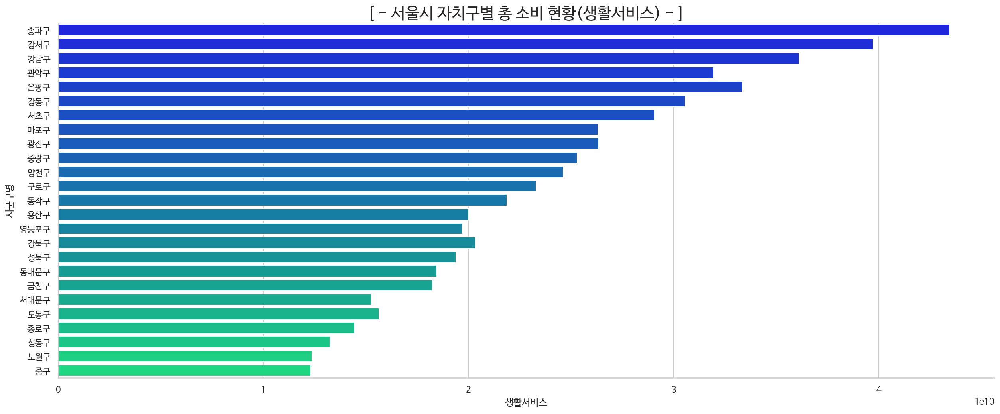

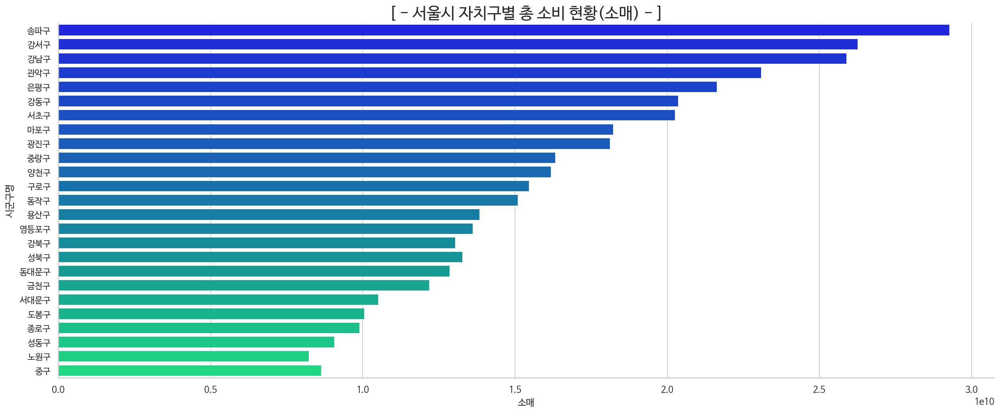

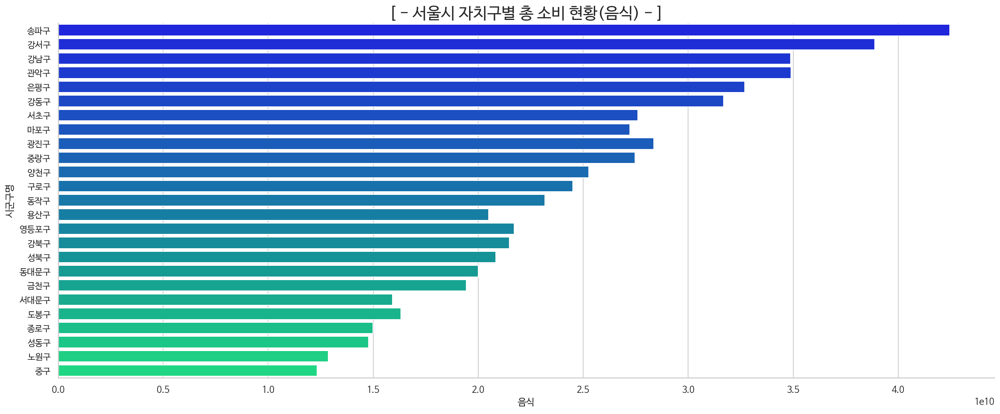

In [ ]:
# 서울시 자치구별 총 소비 현황 # 다 비슷해서 총 소비만 써야될 것 같음...v
plt.rcParams["figure.figsize"] = (20,16)
sns.catplot(x='지출_총금액', y='시군구명', kind='bar', data=merge_comsumption, height=7, aspect=25/10, palette='winter')
plt.title('[ - 서울시 자치구별 총 소비 현황 - ]', fontsize=20)
sns.catplot(x='학문/교육', y='시군구명', kind='bar', data=merge_comsumption, height=7, aspect=25/10, palette='winter')
plt.title('[ - 서울시 자치구별 소비 현황(학문/교육) - ]', fontsize=20)
sns.catplot(x='생활서비스', y='시군구명', kind='bar', data=merge_comsumption, height=7, aspect=25/10, palette='winter')
plt.title('[ - 서울시 자치구별 총 소비 현황(생활서비스) - ]', fontsize=20)
sns.catplot(x='소매', y='시군구명', kind='bar', data=merge_comsumption, height=7, aspect=25/10, palette='winter')
plt.title('[ - 서울시 자치구별 총 소비 현황(소매) - ]', fontsize=20)
sns.catplot(x='음식', y='시군구명', kind='bar', data=merge_comsumption, height=7, aspect=25/10, palette='winter')
plt.title('[ - 서울시 자치구별 총 소비 현황(음식) - ]', fontsize=20)

Text(0.5, 1.0, '[ - 서울시 연도별 총 생활인구 수(2017 ~ 2021) - ]')

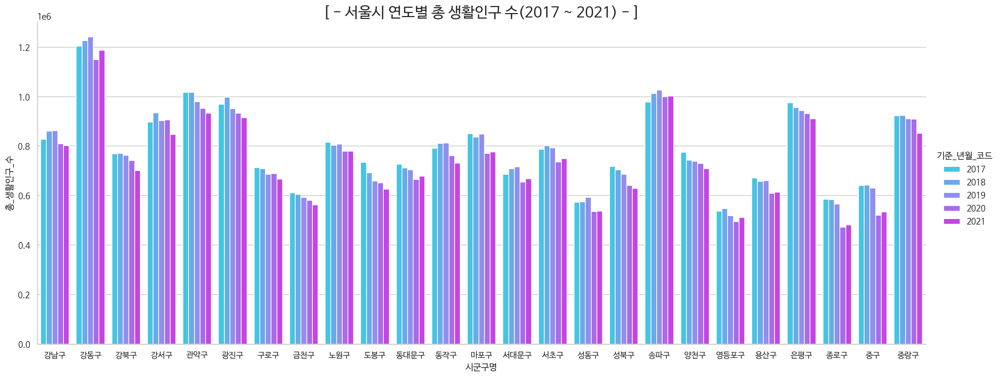

In [ ]:
# 서울시 5개년 소매 업종 현황, 바 그래프 # 인사이트를 얻기 힘들어서 더 합쳐야 함
plt.rcParams["figure.figsize"] = (20,7)
sns.catplot(x='시군구명', y='총_생활인구_수', hue='기준_년월_코드', kind='bar', data=population, height=7, aspect=25/10, palette='cool')
plt.title('[ - 서울시 연도별 총 생활인구 수(2017 ~ 2021) - ]', fontsize=20)

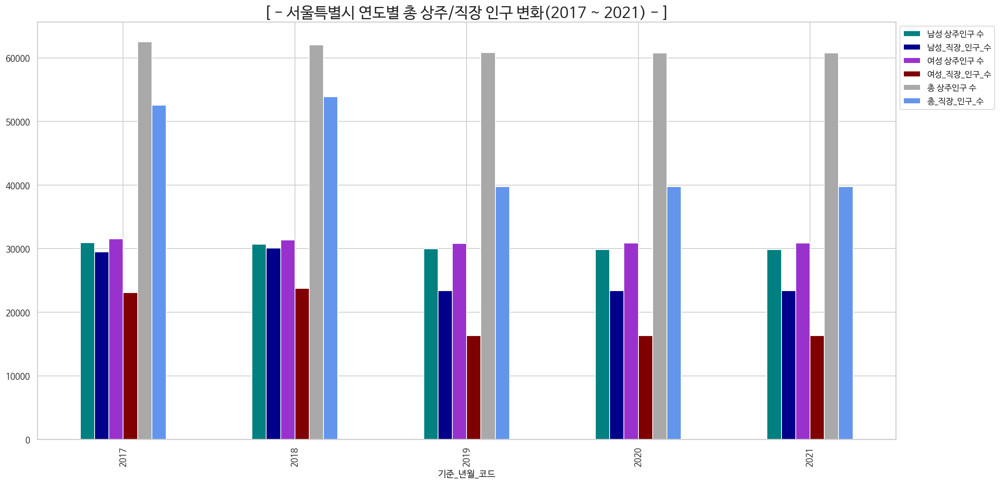

In [ ]:
# 서울특별시 상주, 직장 인구수 변화 5개년
population_p_2 = population_p_1[['남성 상주인구 수', '남성_직장_인구_수', '여성 상주인구 수', '여성_직장_인구_수', '총 상주인구 수', '총_직장_인구_수']]
colors = ['teal','darkblue','darkorchid','maroon','darkgrey','cornflowerblue']
population_p_2.plot(kind='bar', color=colors, legend = True)
plt.rcParams["figure.figsize"] = (20,10)
plt.title('[ - 서울특별시 연도별 총 상주/직장 인구 변화(2017 ~ 2021) - ]', fontsize=20)
plt.legend(loc = 2, bbox_to_anchor = (1,1))
plt.show()

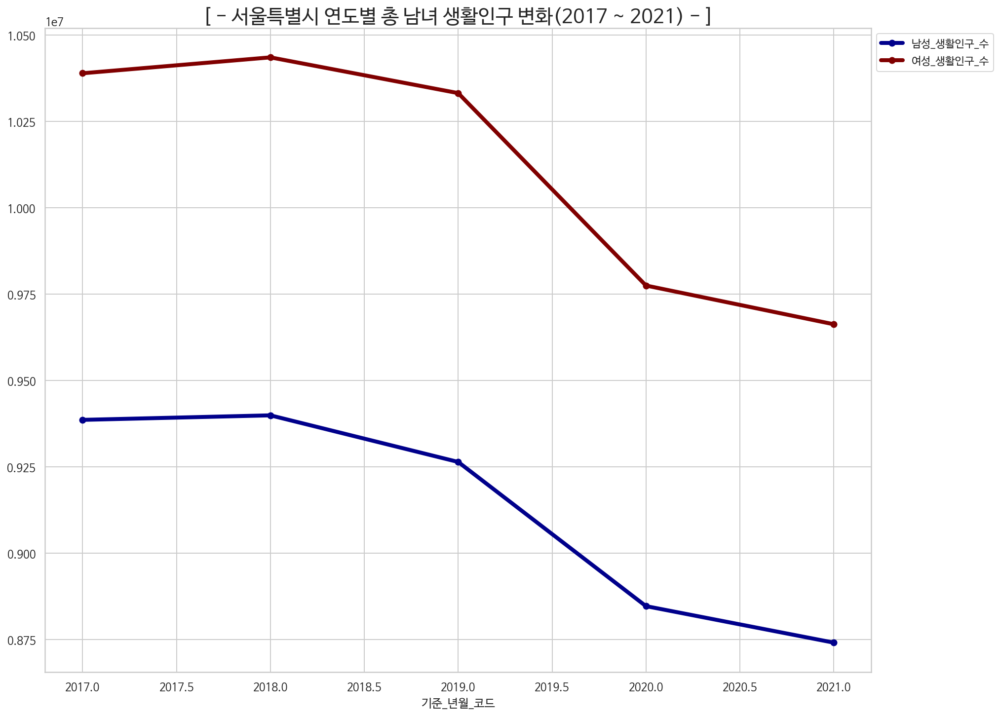

In [ ]:
# 서울특별시 생활 인구수 변화 5개년 
population_p_3 = population_p_1[['남성_생활인구_수', '여성_생활인구_수']]
colors = ['darkblue','maroon',]
population_p_3.plot(kind='line', marker='o', linewidth = "4", color=colors, legend = True)
plt.rcParams["figure.figsize"] = (15,8)
plt.title('[ - 서울특별시 연도별 총 남녀 생활인구 변화(2017 ~ 2021) - ]', fontsize=20)
plt.legend(loc = 2, bbox_to_anchor = (1,1))
plt.show()

Text(0.5, 1.0, '[ - 서울시 자치구 연도별 17시 ~ 21시 교육 매출 (2017 ~ 2021) - ]')

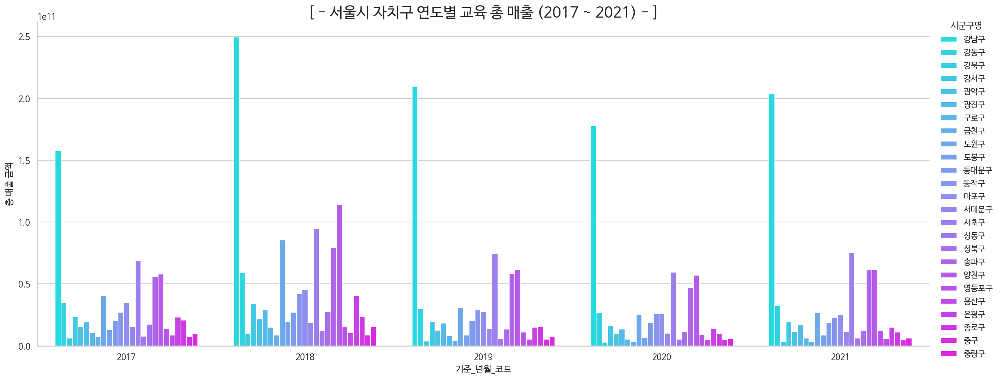

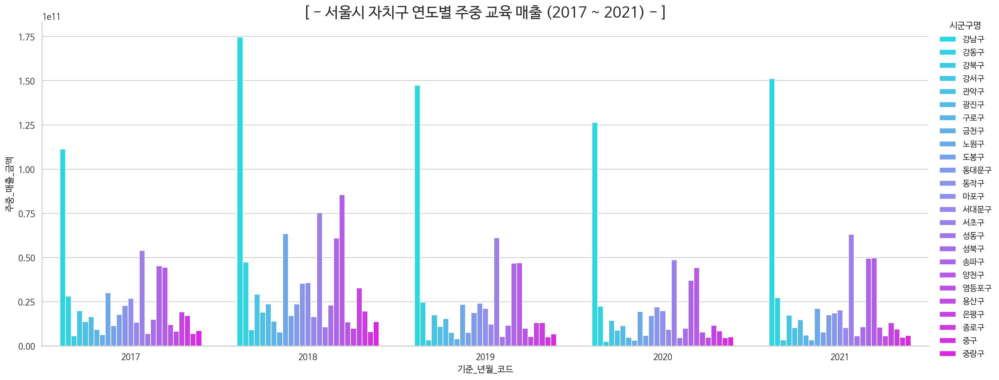

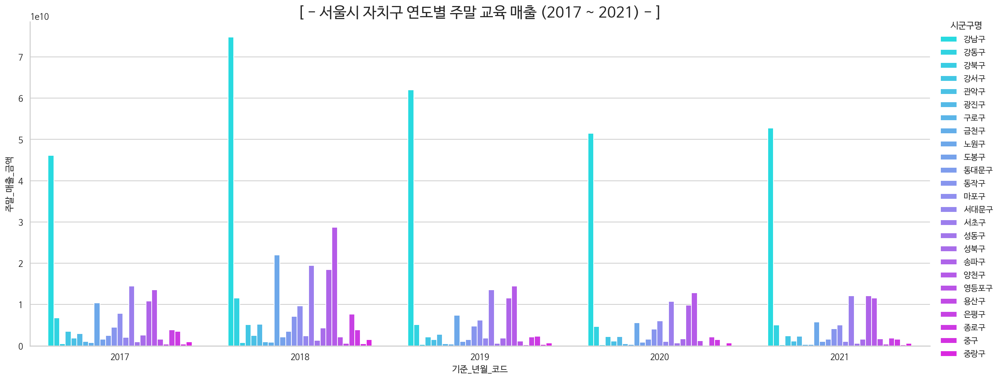

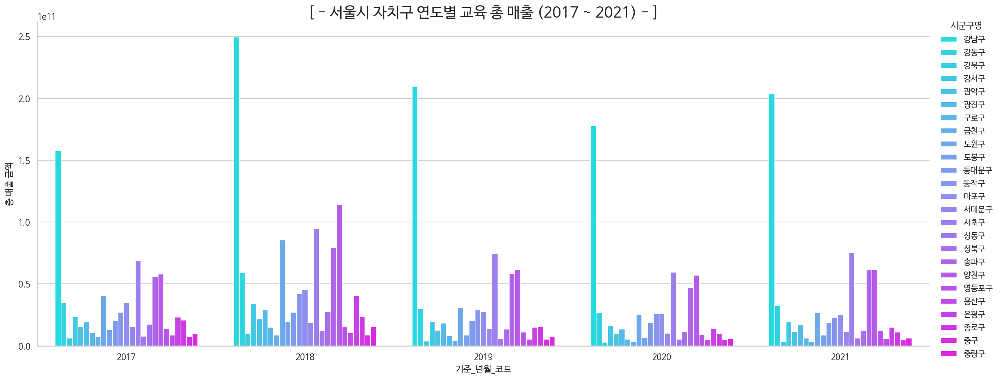

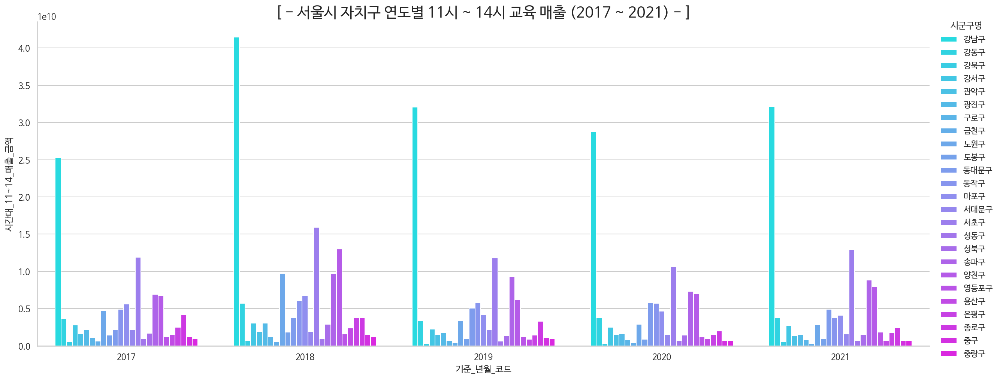

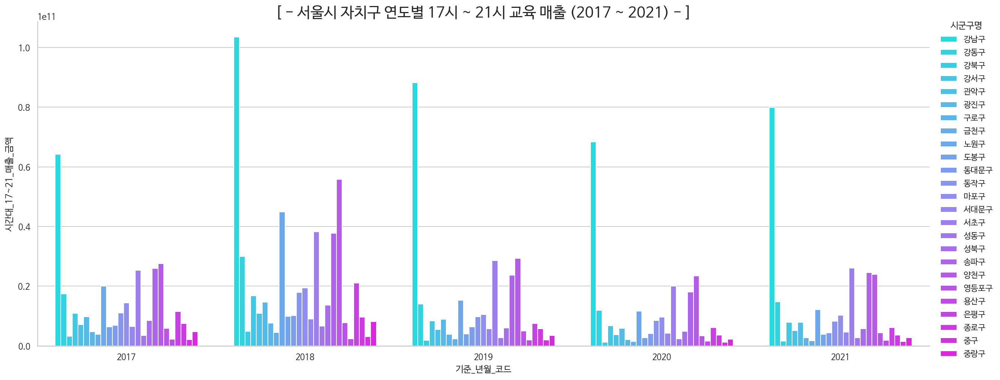

In [ ]:
# 서울시 자치구 연도별 교육 매출
plt.rcParams["figure.figsize"] = (20,5)
sns.catplot(x='기준_년월_코드', y='총 매출 금액', hue='시군구명', kind='bar', data=sales_education_p, height=7, aspect=25/10, palette='cool')
plt.title('[ - 서울시 자치구 연도별 교육 총 매출 (2017 ~ 2021) - ]', fontsize=20)
sns.catplot(x='기준_년월_코드', y='주중_매출_금액', hue='시군구명', kind='bar', data=sales_education_p, height=7, aspect=25/10, palette='cool')
plt.title('[ - 서울시 자치구 연도별 주중 교육 매출 (2017 ~ 2021) - ]', fontsize=20)
sns.catplot(x='기준_년월_코드', y='주말_매출_금액', hue='시군구명', kind='bar', data=sales_education_p, height=7, aspect=25/10, palette='cool')
plt.title('[ - 서울시 자치구 연도별 주말 교육 매출 (2017 ~ 2021) - ]', fontsize=20)
sns.catplot(x='기준_년월_코드', y='총 매출 금액', hue='시군구명', kind='bar', data=sales_education_p, height=7, aspect=25/10, palette='cool')
plt.title('[ - 서울시 자치구 연도별 교육 총 매출 (2017 ~ 2021) - ]', fontsize=20)
sns.catplot(x='기준_년월_코드', y='시간대_11~14_매출_금액', hue='시군구명', kind='bar', data=sales_education_p, height=7, aspect=25/10, palette='cool')
plt.title('[ - 서울시 자치구 연도별 11시 ~ 14시 교육 매출 (2017 ~ 2021) - ]', fontsize=20)
sns.catplot(x='기준_년월_코드', y='시간대_17~21_매출_금액', hue='시군구명', kind='bar', data=sales_education_p, height=7, aspect=25/10, palette='cool')
plt.title('[ - 서울시 자치구 연도별 17시 ~ 21시 교육 매출 (2017 ~ 2021) - ]', fontsize=20)

Text(0.5, 1.0, '[ - 서울시 자치구 연도별 17시 ~ 21시 음식 매출 (2017 ~ 2021) - ]')

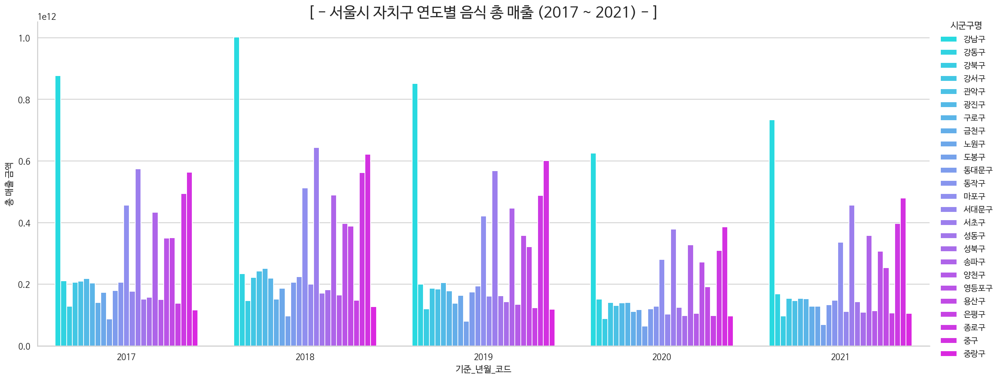

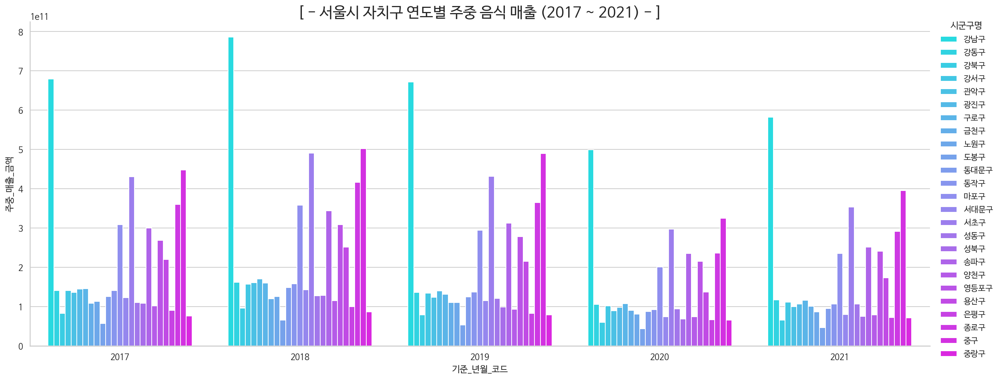

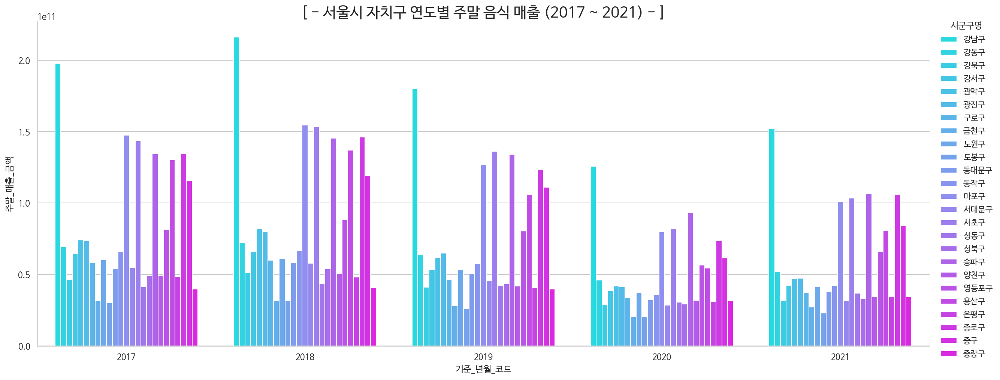

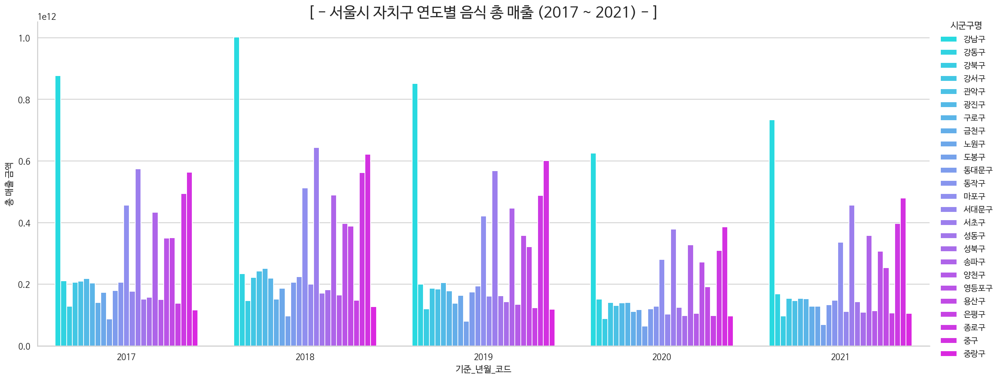

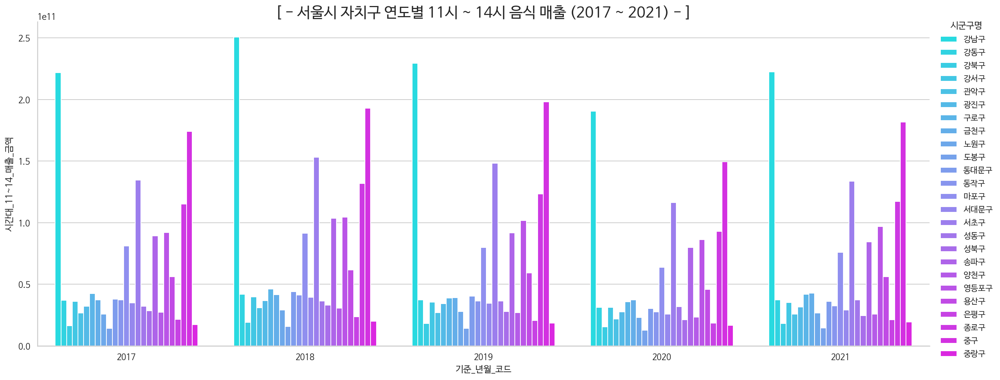

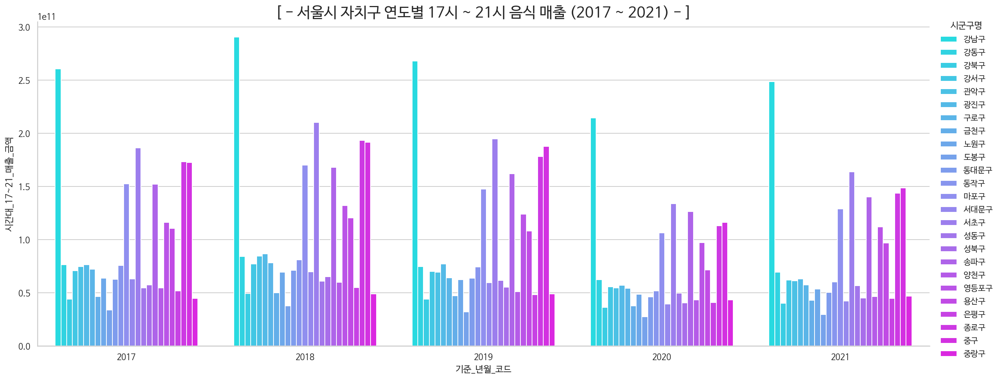

In [ ]:
# 서울시 자치구 연도별 음식 매출
plt.rcParams["figure.figsize"] = (20,5)
sns.catplot(x='기준_년월_코드', y='총 매출 금액', hue='시군구명', kind='bar', data=sales_food_p, height=7, aspect=25/10, palette='cool')
plt.title('[ - 서울시 자치구 연도별 음식 총 매출 (2017 ~ 2021) - ]', fontsize=20)
sns.catplot(x='기준_년월_코드', y='주중_매출_금액', hue='시군구명', kind='bar', data=sales_food_p, height=7, aspect=25/10, palette='cool')
plt.title('[ - 서울시 자치구 연도별 주중 음식 매출 (2017 ~ 2021) - ]', fontsize=20)
sns.catplot(x='기준_년월_코드', y='주말_매출_금액', hue='시군구명', kind='bar', data=sales_food_p, height=7, aspect=25/10, palette='cool')
plt.title('[ - 서울시 자치구 연도별 주말 음식 매출 (2017 ~ 2021) - ]', fontsize=20)
sns.catplot(x='기준_년월_코드', y='총 매출 금액', hue='시군구명', kind='bar', data=sales_food_p, height=7, aspect=25/10, palette='cool')
plt.title('[ - 서울시 자치구 연도별 음식 총 매출 (2017 ~ 2021) - ]', fontsize=20)
sns.catplot(x='기준_년월_코드', y='시간대_11~14_매출_금액', hue='시군구명', kind='bar', data=sales_food_p, height=7, aspect=25/10, palette='cool')
plt.title('[ - 서울시 자치구 연도별 11시 ~ 14시 음식 매출 (2017 ~ 2021) - ]', fontsize=20)
sns.catplot(x='기준_년월_코드', y='시간대_17~21_매출_금액', hue='시군구명', kind='bar', data=sales_food_p, height=7, aspect=25/10, palette='cool')
plt.title('[ - 서울시 자치구 연도별 17시 ~ 21시 음식 매출 (2017 ~ 2021) - ]', fontsize=20)

Text(0.5, 1.0, '[ - 서울시 자치구 연도별 17시 ~ 21시 스포츠 매출 (2017 ~ 2021) - ]')

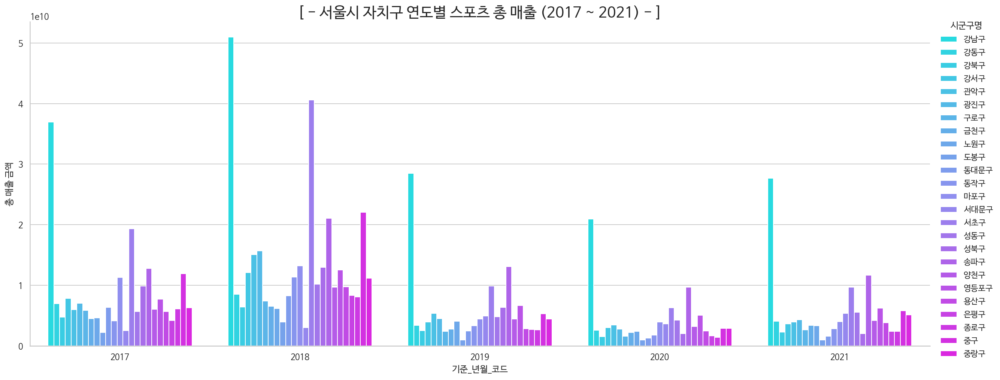

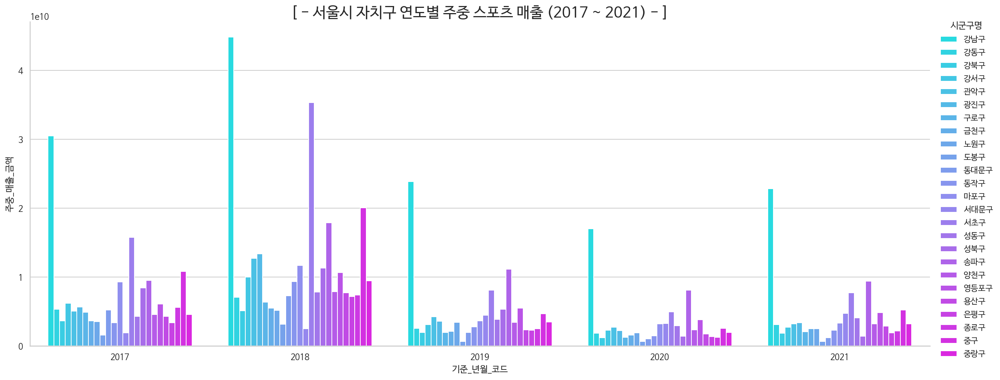

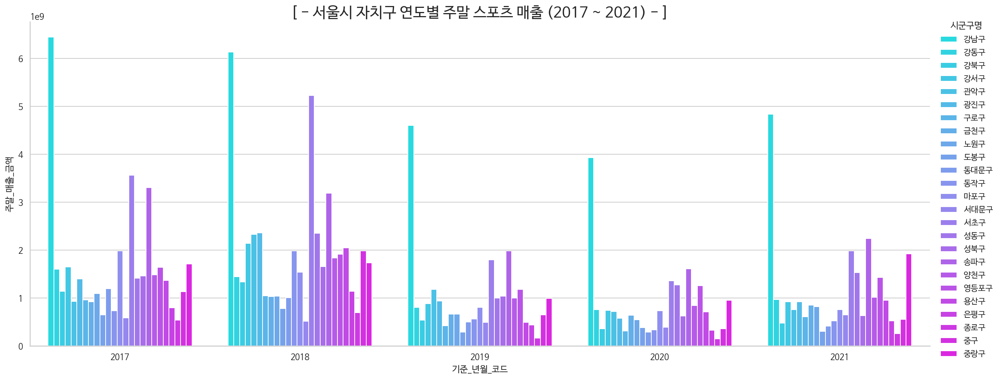

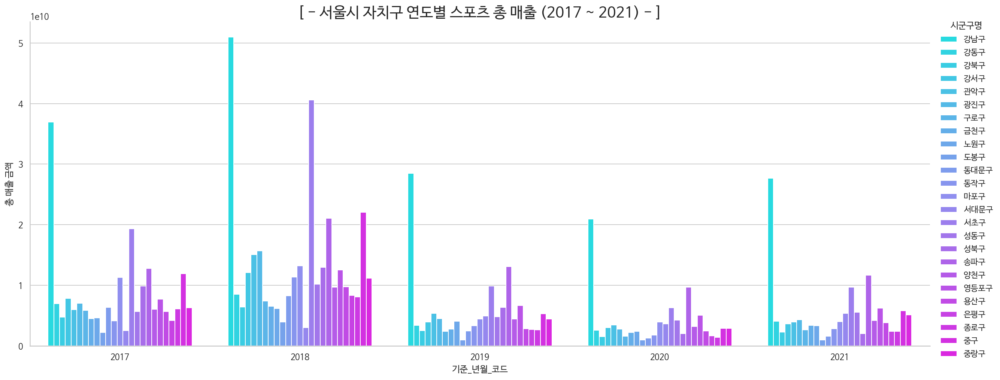

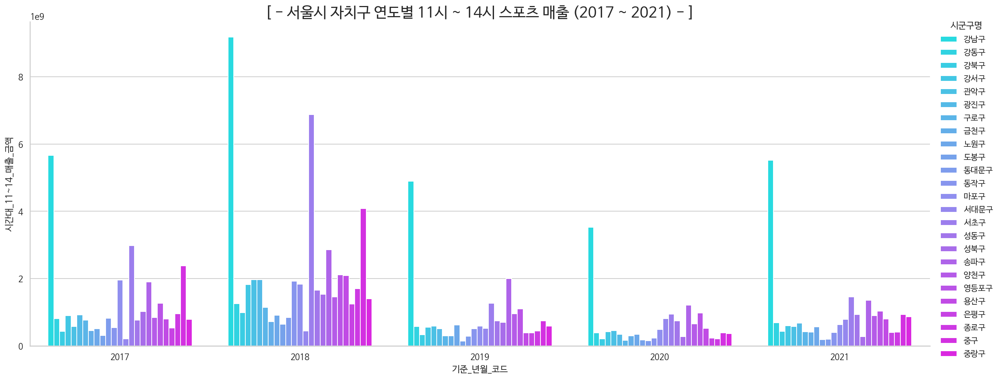

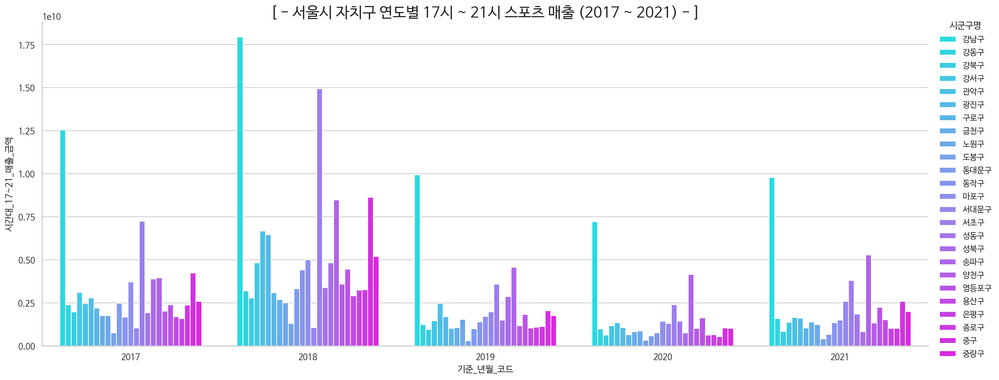

In [ ]:
# 서울시 자치구 연도별 스포츠 매출
plt.rcParams["figure.figsize"] = (20,5)
sns.catplot(x='기준_년월_코드', y='총 매출 금액', hue='시군구명', kind='bar', data=sales_sports_p, height=7, aspect=25/10, palette='cool')
plt.title('[ - 서울시 자치구 연도별 스포츠 총 매출 (2017 ~ 2021) - ]', fontsize=20)
sns.catplot(x='기준_년월_코드', y='주중_매출_금액', hue='시군구명', kind='bar', data=sales_sports_p, height=7, aspect=25/10, palette='cool')
plt.title('[ - 서울시 자치구 연도별 주중 스포츠 매출 (2017 ~ 2021) - ]', fontsize=20)
sns.catplot(x='기준_년월_코드', y='주말_매출_금액', hue='시군구명', kind='bar', data=sales_sports_p, height=7, aspect=25/10, palette='cool')
plt.title('[ - 서울시 자치구 연도별 주말 스포츠 매출 (2017 ~ 2021) - ]', fontsize=20)
sns.catplot(x='기준_년월_코드', y='총 매출 금액', hue='시군구명', kind='bar', data=sales_sports_p, height=7, aspect=25/10, palette='cool')
plt.title('[ - 서울시 자치구 연도별 스포츠 총 매출 (2017 ~ 2021) - ]', fontsize=20)
sns.catplot(x='기준_년월_코드', y='시간대_11~14_매출_금액', hue='시군구명', kind='bar', data=sales_sports_p, height=7, aspect=25/10, palette='cool')
plt.title('[ - 서울시 자치구 연도별 11시 ~ 14시 스포츠 매출 (2017 ~ 2021) - ]', fontsize=20)
sns.catplot(x='기준_년월_코드', y='시간대_17~21_매출_금액', hue='시군구명', kind='bar', data=sales_sports_p, height=7, aspect=25/10, palette='cool')
plt.title('[ - 서울시 자치구 연도별 17시 ~ 21시 스포츠 매출 (2017 ~ 2021) - ]', fontsize=20)

Text(0.5, 1.0, '[ - 서울시 자치구 연도별 17시 ~ 21시 생활서비스 매출 (2017 ~ 2021) - ]')

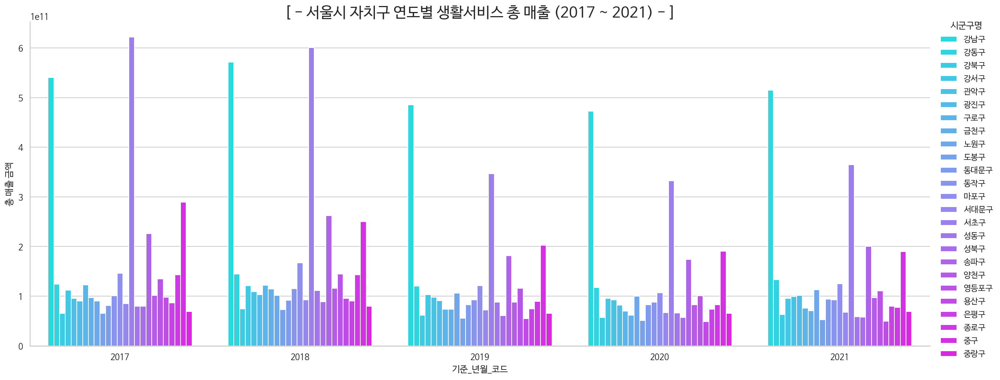

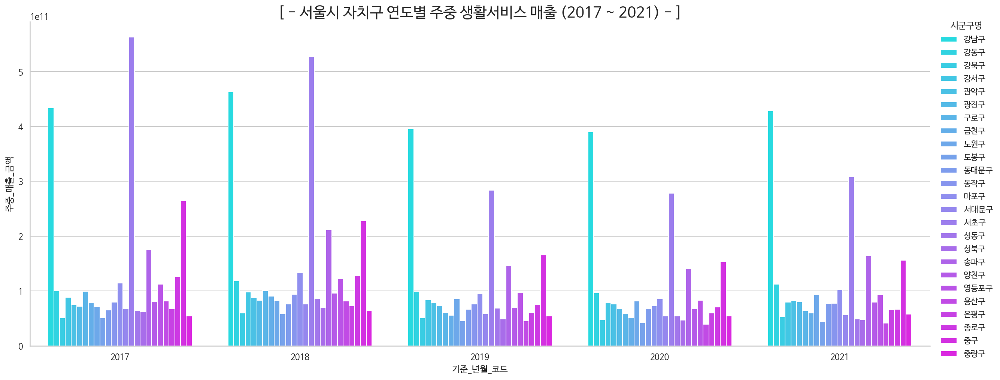

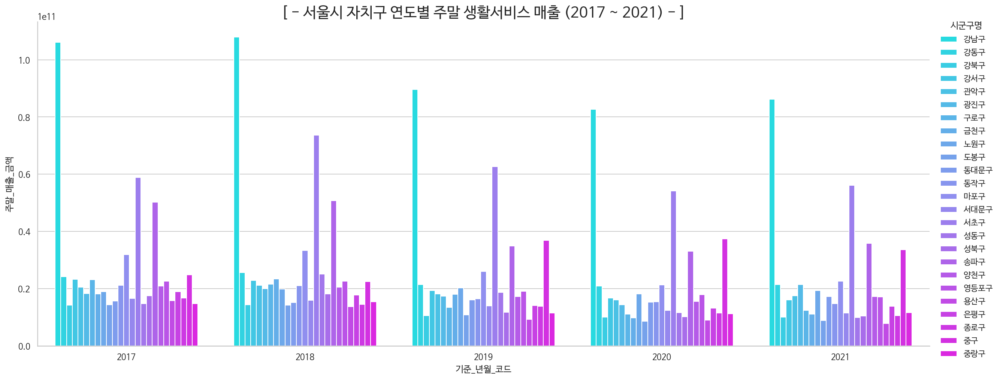

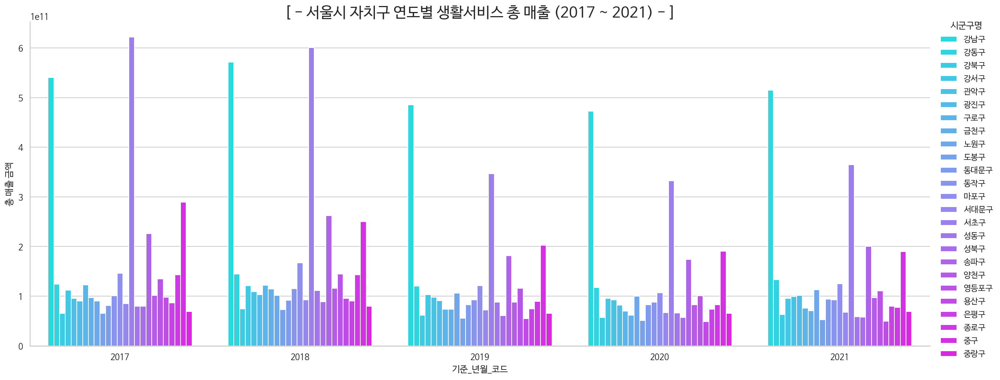

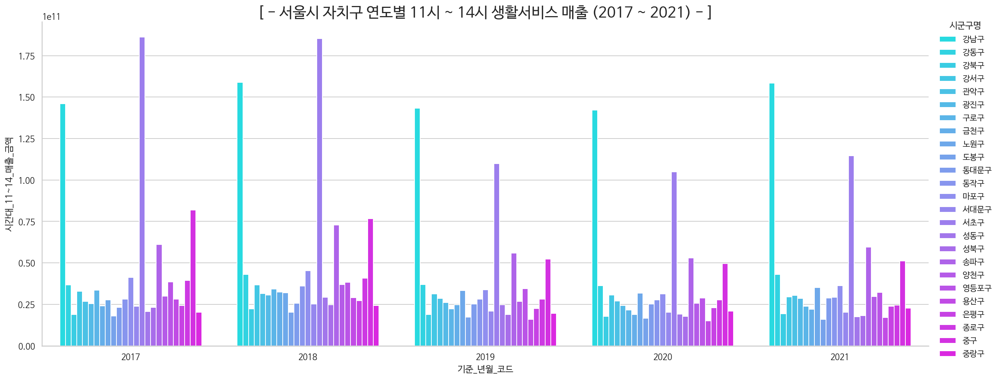

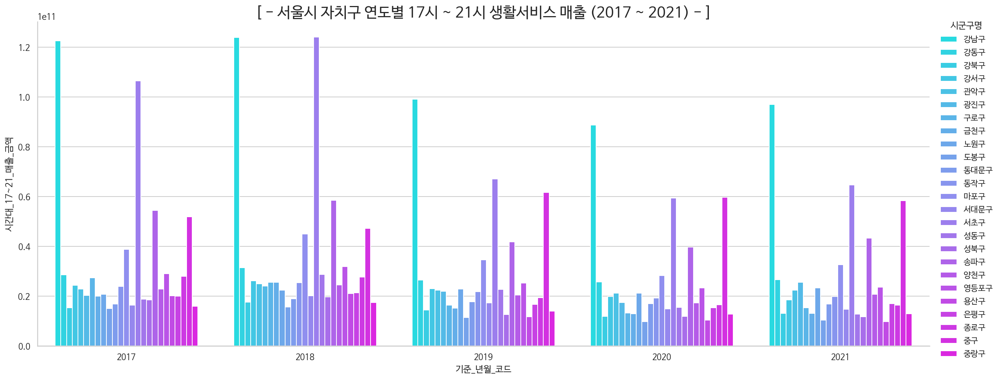

In [ ]:
# 서울시 자치구 연도별 생활서비스 매출
plt.rcParams["figure.figsize"] = (20,5)
sns.catplot(x='기준_년월_코드', y='총 매출 금액', hue='시군구명', kind='bar', data=sales_service_p, height=7, aspect=25/10, palette='cool')
plt.title('[ - 서울시 자치구 연도별 생활서비스 총 매출 (2017 ~ 2021) - ]', fontsize=20)
sns.catplot(x='기준_년월_코드', y='주중_매출_금액', hue='시군구명', kind='bar', data=sales_service_p, height=7, aspect=25/10, palette='cool')
plt.title('[ - 서울시 자치구 연도별 주중 생활서비스 매출 (2017 ~ 2021) - ]', fontsize=20)
sns.catplot(x='기준_년월_코드', y='주말_매출_금액', hue='시군구명', kind='bar', data=sales_service_p, height=7, aspect=25/10, palette='cool')
plt.title('[ - 서울시 자치구 연도별 주말 생활서비스 매출 (2017 ~ 2021) - ]', fontsize=20)
sns.catplot(x='기준_년월_코드', y='총 매출 금액', hue='시군구명', kind='bar', data=sales_service_p, height=7, aspect=25/10, palette='cool')
plt.title('[ - 서울시 자치구 연도별 생활서비스 총 매출 (2017 ~ 2021) - ]', fontsize=20)
sns.catplot(x='기준_년월_코드', y='시간대_11~14_매출_금액', hue='시군구명', kind='bar', data=sales_service_p, height=7, aspect=25/10, palette='cool')
plt.title('[ - 서울시 자치구 연도별 11시 ~ 14시 생활서비스 매출 (2017 ~ 2021) - ]', fontsize=20)
sns.catplot(x='기준_년월_코드', y='시간대_17~21_매출_금액', hue='시군구명', kind='bar', data=sales_service_p, height=7, aspect=25/10, palette='cool')
plt.title('[ - 서울시 자치구 연도별 17시 ~ 21시 생활서비스 매출 (2017 ~ 2021) - ]', fontsize=20)

Text(0.5, 1.0, '[ - 서울시 자치구 연도별 17시 ~ 21시 소매 매출 (2017 ~ 2021) - ]')

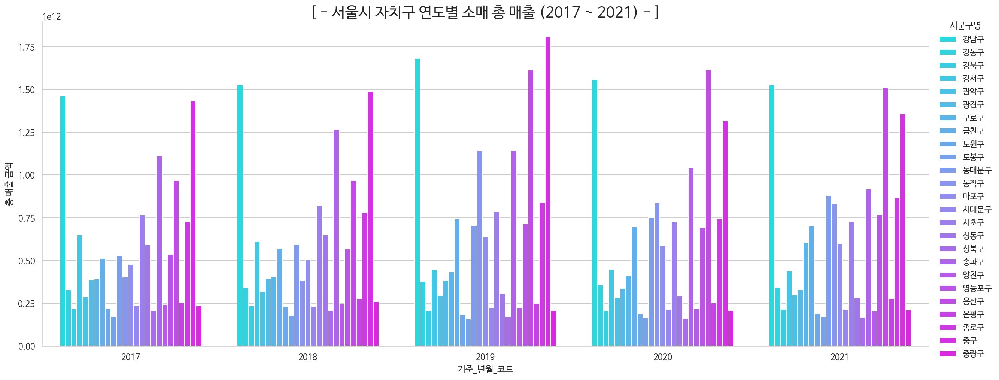

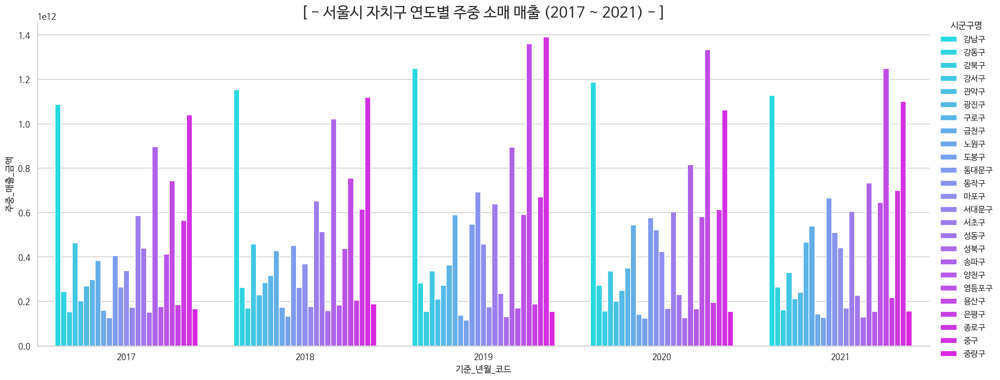

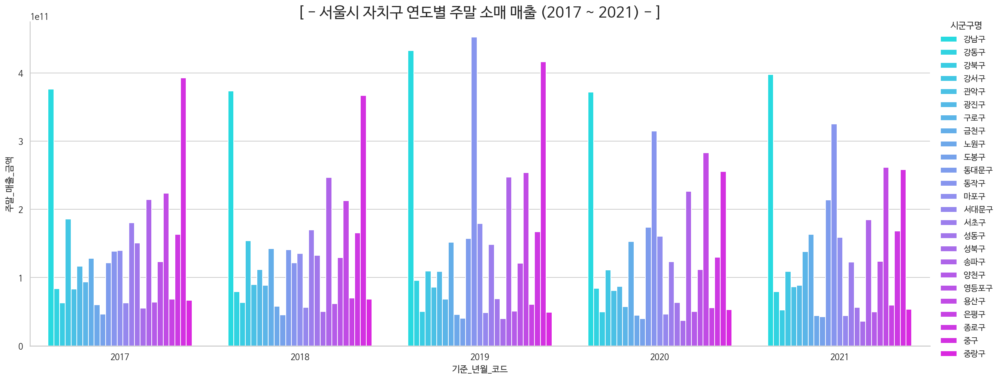

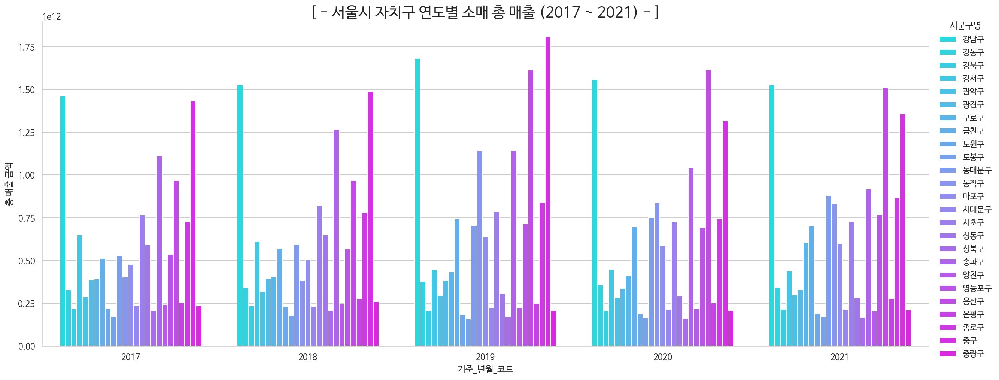

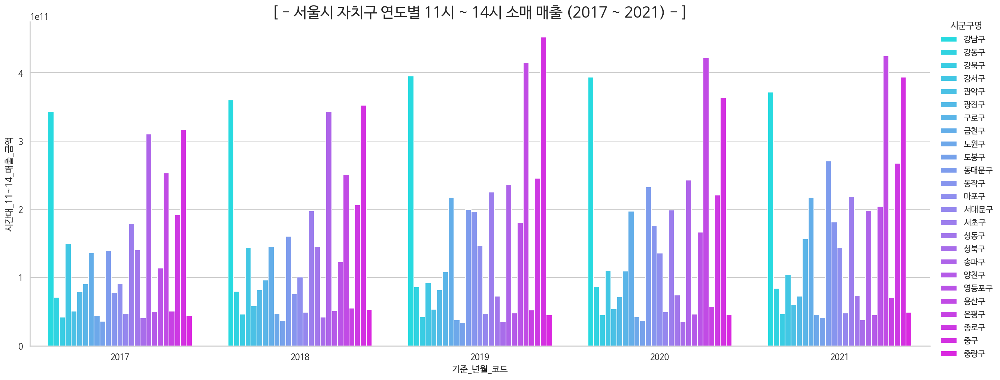

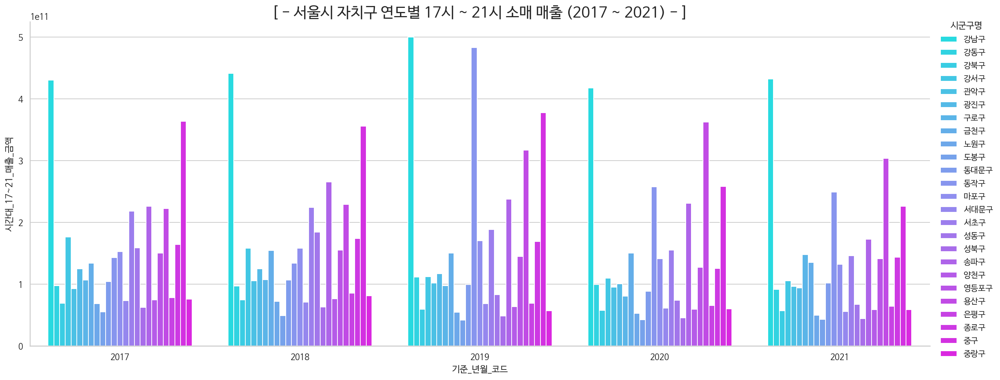

In [ ]:
# 서울시 자치구 연도별 소매 매출
plt.rcParams["figure.figsize"] = (20,5)
sns.catplot(x='기준_년월_코드', y='총 매출 금액', hue='시군구명', kind='bar', data=sales_retail_p, height=7, aspect=25/10, palette='cool')
plt.title('[ - 서울시 자치구 연도별 소매 총 매출 (2017 ~ 2021) - ]', fontsize=20)
sns.catplot(x='기준_년월_코드', y='주중_매출_금액', hue='시군구명', kind='bar', data=sales_retail_p, height=7, aspect=25/10, palette='cool')
plt.title('[ - 서울시 자치구 연도별 주중 소매 매출 (2017 ~ 2021) - ]', fontsize=20)
sns.catplot(x='기준_년월_코드', y='주말_매출_금액', hue='시군구명', kind='bar', data=sales_retail_p, height=7, aspect=25/10, palette='cool')
plt.title('[ - 서울시 자치구 연도별 주말 소매 매출 (2017 ~ 2021) - ]', fontsize=20)
sns.catplot(x='기준_년월_코드', y='총 매출 금액', hue='시군구명', kind='bar', data=sales_retail_p, height=7, aspect=25/10, palette='cool')
plt.title('[ - 서울시 자치구 연도별 소매 총 매출 (2017 ~ 2021) - ]', fontsize=20)
sns.catplot(x='기준_년월_코드', y='시간대_11~14_매출_금액', hue='시군구명', kind='bar', data=sales_retail_p, height=7, aspect=25/10, palette='cool')
plt.title('[ - 서울시 자치구 연도별 11시 ~ 14시 소매 매출 (2017 ~ 2021) - ]', fontsize=20)
sns.catplot(x='기준_년월_코드', y='시간대_17~21_매출_금액', hue='시군구명', kind='bar', data=sales_retail_p, height=7, aspect=25/10, palette='cool')
plt.title('[ - 서울시 자치구 연도별 17시 ~ 21시 소매 매출 (2017 ~ 2021) - ]', fontsize=20)

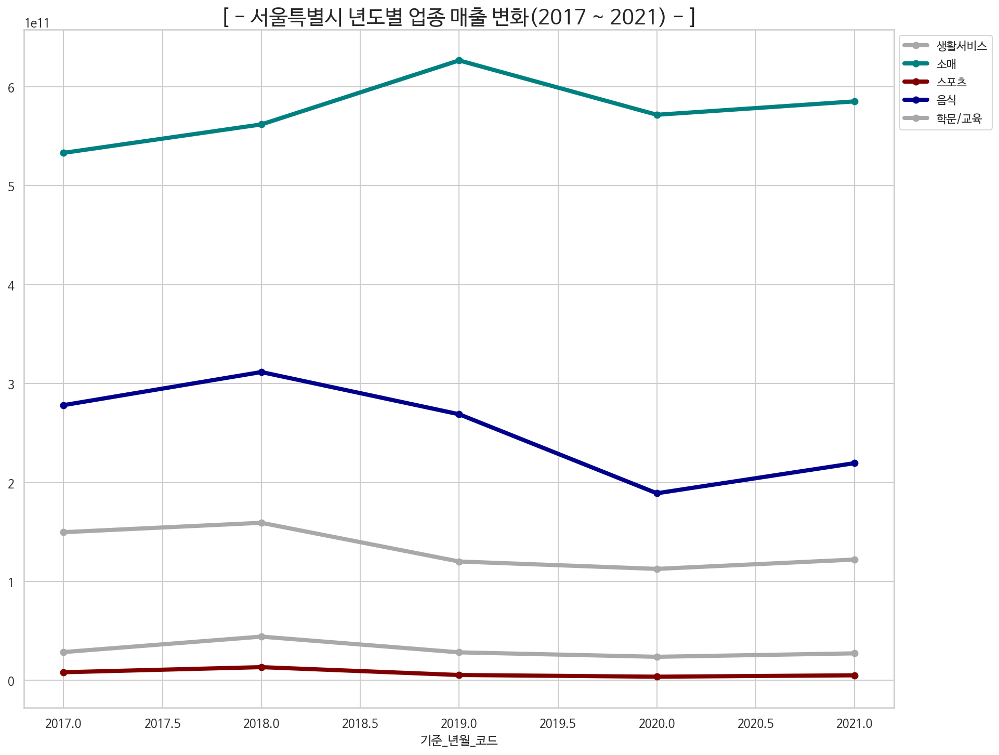

In [ ]:
# 총매출
colors = ['darkgrey','teal','maroon','darkblue','darkgrey']
merge_sp.plot(kind='line', marker='o', linewidth = "4", color=colors, legend = True)
plt.rcParams["figure.figsize"] = (15,12)
plt.title('[ - 서울특별시 년도별 업종 매출 변화(2017 ~ 2021) - ]', fontsize=20)
plt.legend(loc = 2, bbox_to_anchor = (1,1))
plt.show()

## 지도시각화 - 소득, 소비, 매출, 지하철역, 버스정거장

## 서울시 5개년도 업종별 상권분석 : 소득/소비

### 필요한 라이브러리 import

In [ ]:
import warnings
warnings.filterwarnings('ignore')

import os
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import numpy as np
import pandas as pd
from glob import glob
from tqdm import tqdm
import time
from functools import reduce

!pip install pyproj
import pyproj

import json
import requests
%matplotlib inline 
import seaborn as sns 
sns.set()

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


### 소득소비 데이터 전처리

In [ ]:
info = pd.read_csv("./data/commercial_info_2021.csv", sep = ',', index_col = 0)
area = pd.read_csv("./data/commercial_area2021.csv", sep = ',')
income_21 = pd.read_csv("./data/income_consumption_2021.csv", sep = ',')

In [ ]:
income_21 = income_21[income_21.columns[2:]]

In [ ]:
com_list = [ info, area, income_21]
df_2021_1 = reduce(lambda  left,right: pd.merge(left,right,on=['상권_코드'], how='outer'), com_list[1:])

In [ ]:
info = info[['시군구코드', '시군구명']]
info = info.drop_duplicates().reset_index(drop=True)
info.rename(columns={'시군구코드':'시군구_코드'}, inplace=True)

df_2021 = pd.merge(df_2021_1, info, on='시군구_코드')

In [ ]:
def project_array(coord, p1_type, p2_type):
    """
    좌표계 변환 함수
    - coord: x, y 좌표 정보가 담긴 NumPy Array
    - p1_type: 입력 좌표계 정보 ex) epsg:5179
    - p2_type: 출력 좌표계 정보 ex) epsg:4326
    """
    p1 = pyproj.Proj(init=p1_type)
    p2 = pyproj.Proj(init=p2_type)
    fx, fy = pyproj.transform(p1, p2, coord[:, 0], coord[:, 1])
    return np.dstack([fx, fy])[0]

In [ ]:
coord_21 = np.array(df_2021[['엑스좌표_값', '와이좌표_값']])

In [ ]:
# 좌표계 정보 설정
p1_type = "epsg:5181"
p2_type = "epsg:4326"

# project_array() 함수 실행
result_21 = project_array(coord_21, p1_type, p2_type)

In [ ]:
df_2021['위도_x'] = result_21[:,1]
df_2021['경도_y'] = result_21[:,0]

In [ ]:
print(df_2021.columns)

Index(['기준_년월_코드', '상권_구분_코드', '상권_구분_코드_명', '상권_코드', '엑스좌표_값', '와이좌표_값',
       '시군구_코드', '월_평균_소득_금액', '지출_총금액', '식료품_지출_총금액', '의류_신발_지출_총금액',
       '생활용품_지출_총금액', '의료비_지출_총금액', '교통_지출_총금액', '여가_지출_총금액', '문화_지출_총금액',
       '교육_지출_총금액', '유흥_지출_총금액', '시군구명', '위도_x', '경도_y'],
      dtype='object')


In [ ]:
df_2021['관광/여가/오락'] = df_2021['여가_지출_총금액'] + df_2021['문화_지출_총금액']
df_2021['생활서비스'] = df_2021['교통_지출_총금액'] + df_2021['의료비_지출_총금액']
df_2021['소매'] = df_2021['생활용품_지출_총금액'] + df_2021['의류_신발_지출_총금액']
df_2021['음식'] = df_2021['식료품_지출_총금액'] + df_2021['유흥_지출_총금액']
df_2021['학문/교육'] = df_2021['교육_지출_총금액']

df_2021_ori = df_2021.copy()

In [ ]:
remain_cols = ['상권_코드', '시군구_코드', '시군구명', '위도_x', '경도_y', '월_평균_소득_금액', '지출_총금액', '관광/여가/오락', '생활서비스',
       '소매', '음식', '학문/교육']

In [ ]:
df_2021 = df_2021[remain_cols]

In [ ]:
year_data = [2021]
df = [df_2021]

In [ ]:
income_avg = list()
comsumption_total = list()
comsumption_orak = list()
comsumption_service = list()
comsumption_retail = list()
comsumption_food = list()
comsumption_education = list()

In [ ]:
for i in range(len(df)):

    income_avg.append(df[i][['월_평균_소득_금액', '시군구명']])
    income_avg[i] = income_avg[i].groupby(['시군구명'], as_index=False).sum()
    income_avg[i].sort_values('월_평균_소득_금액', ascending=False, inplace=True)

    comsumption_total.append(df[i][['지출_총금액', '시군구명']])
    comsumption_total[i] = comsumption_total[i].groupby(['시군구명'], as_index=False).sum()
    comsumption_total[i].sort_values('지출_총금액', ascending=False, inplace=True)

    comsumption_orak.append(df[i][['관광/여가/오락', '시군구명']])
    comsumption_orak[i] = comsumption_orak[i].groupby(['시군구명'], as_index=False).sum()
    comsumption_orak[i].sort_values('관광/여가/오락', ascending=False, inplace=True)

    comsumption_service.append(df[i][['생활서비스', '시군구명']])
    comsumption_service[i] = comsumption_service[i].groupby(['시군구명'], as_index=False).sum()
    comsumption_service[i].sort_values('생활서비스', ascending=False, inplace=True)

    comsumption_retail.append(df[i][['소매', '시군구명']])
    comsumption_retail[i] = comsumption_retail[i].groupby(['시군구명'], as_index=False).sum()
    comsumption_retail[i].sort_values('소매', ascending=False, inplace=True)

    comsumption_food.append(df[i][['음식', '시군구명']])
    comsumption_food[i] = comsumption_food[i].groupby(['시군구명'], as_index=False).sum()
    comsumption_food[i].sort_values('음식', ascending=False, inplace=True)

    comsumption_education.append(df[i][['학문/교육', '시군구명']])
    comsumption_education[i] = comsumption_education[i].groupby(['시군구명'], as_index=False).sum()
    comsumption_education[i].sort_values('학문/교육', ascending=False, inplace=True)

    # return comsumption_total, comsumption_orak, comsumption_service, comsumption_retail, comsumption_food, comsumption_education

### Folium 지도 시각화

In [ ]:
import folium
import requests
import json
from folium.plugins import MarkerCluster
from branca.colormap import linear
from folium import plugins


# 서울 행정구역 json raw파일(githubcontent)
r = requests.get('https://raw.githubusercontent.com/southkorea/seoul-maps/master/kostat/2013/json/seoul_municipalities_geo_simple.json')
c = r.content
seoul_geo = json.loads(c)

#### 2021년 서울시 지출 내역

In [ ]:
map = folium.Map(location=[37.541, 126.986], zoom_start = 11, tiles='CartoDB positron')

folium.Choropleth(
    geo_data=seoul_geo,
    name = '2021 서울시 지역별 지출 총금액',
    data = comsumption_total[-1],
    columns = ['시군구명','지출_총금액'],
    fill_color='PuBu', # 색상 변경도 가능하다
    fill_opacity=0.8,
    line_opacity=0.5,
    key_on='feature.properties.name',
    show = False,
    legend_name="지역구별 지출 총금액",
    overlay = True,
    Highlight = True
).add_to(map)

folium.Choropleth(
    geo_data=seoul_geo,
    name = '2021 서울시 지역별 [관광/여가/오락] 업종 지출금액',
    data = comsumption_orak[-1],
    columns = ['시군구명','관광/여가/오락'],
    fill_color='PuBu', # 색상 변경도 가능하다
    fill_opacity=0.8,
    line_opacity=0.5,
    key_on='feature.properties.name',
    show = False,
    legend_name="지역구별 관광/여가/오락 지출금액",
    overlay = True,
    Highlight = True
).add_to(map)


folium.Choropleth(
    geo_data=seoul_geo,
    name = '2021 서울시 지역별 [생활서비스] 업종 지출금액',
    data = comsumption_service[-1],
    columns = ['시군구명','생활서비스'],
    fill_color='PuBu', # 색상 변경도 가능하다
    fill_opacity=0.8,
    line_opacity=0.5,
    key_on='feature.properties.name',
    show = False,
    legend_name="지역구별 생활서비스 지출금액",
    overlay = True,
    Highlight = True
).add_to(map)

folium.Choropleth(
    geo_data=seoul_geo,
    name = '2021 서울시 지역별 [소매] 업종 지출금액',
    data = comsumption_retail[-1],
    columns = ['시군구명','소매'],
    fill_color='PuBu', # 색상 변경도 가능하다
    fill_opacity=0.8,
    line_opacity=0.5,
    key_on='properties.name',
    show = False,
    legend_name="지역구별 소매 지출금액",
    overlay = True,
    Highlight = True
).add_to(map)

folium.Choropleth(
    geo_data=seoul_geo,
    name = '2021 서울시 지역별 [음식] 업종 지출금액',
    data = comsumption_food[-1],
    columns = ['시군구명','음식'],
    fill_color='PuBu', # 색상 변경도 가능하다
    fill_opacity=0.8,
    line_opacity=0.5,
    key_on='properties.name',
    #show = False,
    legend_name="지역구별 음식 지출금액",
    overlay = True,
    Highlight = True
).add_to(map)

folium.Choropleth(
    geo_data=seoul_geo,
    name = '2021 서울시 지역별 [학문/교육] 업종 지출금액',
    data = comsumption_education[-1],
    columns = ['시군구명','학문/교육'],
    fill_color='PuBu', # 색상 변경도 가능하다
    fill_opacity=0.8,
    line_opacity=0.5,
    key_on='feature.properties.name',
    show = False,
    legend_name="지역구별 학문/교육 지출금액",
    overlay = True,
    Highlight = True
).add_to(map)

map.save('./map/2021년 서울시 지출 내역_map.html')

map

#### 서울시 월 평균 소득금액

In [ ]:
map = folium.Map(location=[37.541, 126.986], zoom_start = 11)

folium.Choropleth(
    geo_data=seoul_geo,
    name = '2021 서울시 지역별 월 평균 소득금액',
    data = income_avg[4],
    columns = ['시군구명','월_평균_소득_금액'],
    fill_color='YlOrRd', # 색상 변경도 가능하다
    fill_opacity=0.8,
    line_opacity=0.5,
    key_on='feature.properties.name',
    show = False,
    legend_name="2021",
    overlay = True,
    Highlight = True
).add_to(map)

map

#### 서울시 지출 총 금액

In [ ]:
map = folium.Map(location=[37.541, 126.986], zoom_start = 11)

folium.Choropleth(
    geo_data=seoul_geo,
    name = '2021 서울시 지역별 지출 총금액',
    data = comsumption_total[4],
    columns = ['시군구명','지출_총금액'],
    fill_color='YlOrRd', # 색상 변경도 가능하다
    fill_opacity=0.8,
    line_opacity=0.5,
    key_on='feature.properties.name',
    show = False,
    legend_name="2021",
    overlay = True,
    Highlight = True
).add_to(map)

map

# 서울시 업종별 매출 분석 : 재연

### 필요한 라이브러리 import

In [ ]:
import warnings
warnings.filterwarnings('ignore')

import os
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import numpy as np
import pandas as pd
from glob import glob
from tqdm import tqdm
import time
from functools import reduce

!pip install pyproj
import pyproj

import json
import requests
%matplotlib inline 
import seaborn as sns 
sns.set()

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


### 추정매출 데이터 전처리

In [ ]:
info = pd.read_csv("./data/commercial_info_2021.csv", sep = ',', index_col = 0)
area = pd.read_csv("./data/commercial_area2021.csv", sep = ',')
sales_21 = pd.read_csv("./data/estimation_sales_2021.csv", sep = ',')

In [ ]:
com_list = [info, area, sales_21]

In [ ]:
for i in com_list:
    print(i.columns)

Index(['상호명', '상권업종대분류코드', '상권업종대분류명', '상권업종중분류코드', '상권업종중분류명', '상권업종소분류코드',
       '상권업종소분류명', '시군구코드', '시군구명', '행정동코드', '행정동명', '법정동코드', '법정동명', '경도',
       '위도'],
      dtype='object')
Index(['기준_년월_코드', '상권_구분_코드', '상권_구분_코드_명', '상권_코드', '엑스좌표_값', '와이좌표_값',
       '시군구_코드'],
      dtype='object')
Index(['기준_년_코드', '기준_분기_코드', '상권_코드', '서비스_업종_코드_명', '분기당_매출_금액', '주중_매출_금액',
       '주말_매출_금액', '시간대_00~06_매출_금액', '시간대_06~11_매출_금액', '시간대_11~14_매출_금액',
       '시간대_14~17_매출_금액', '시간대_17~21_매출_금액', '시간대_21~24_매출_금액', '남성_매출_금액',
       '여성_매출_금액'],
      dtype='object')
Index(['기준_년_코드', '기준_분기_코드', '상권_코드', '서비스_업종_코드_명', '분기당_매출_금액', '주중_매출_금액',
       '주말_매출_금액', '시간대_00~06_매출_금액', '시간대_06~11_매출_금액', '시간대_11~14_매출_금액',
       '시간대_14~17_매출_금액', '시간대_17~21_매출_금액', '시간대_21~24_매출_금액', '남성_매출_금액',
       '여성_매출_금액'],
      dtype='object')
Index(['기준_년_코드', '기준_분기_코드', '상권_코드', '서비스_업종_코드_명', '분기당_매출_금액', '주중_매출_금액',
       '주말_매출_금액', '시간대_00~06_매출_금액', '시간대_06~11_매출_금액', '시간대_11~14_매출_금

In [ ]:
info['상권업종대분류명'].value_counts()

음식          111653
소매           94320
생활서비스        58438
학문/교육        22765
부동산          14254
관광/여가/오락      7095
스포츠           4636
숙박            2132
Name: 상권업종대분류명, dtype: int64

In [ ]:
sales_21 = sales_21[sales_21.columns[2:]]

In [ ]:
com_list = [ info, area, sales_21]
df_2021_1 = reduce(lambda  left,right: pd.merge(left,right,on=['상권_코드'], how='outer'), com_list[1:])

In [ ]:
info = info[['시군구코드', '시군구명']]
info = info.drop_duplicates().reset_index(drop=True)
info.rename(columns={'시군구코드':'시군구_코드'}, inplace=True)

df_2021 = pd.merge(df_2021_1, info, on='시군구_코드')

In [ ]:
def project_array(coord, p1_type, p2_type):
    """
    좌표계 변환 함수
    - coord: x, y 좌표 정보가 담긴 NumPy Array
    - p1_type: 입력 좌표계 정보 ex) epsg:5179
    - p2_type: 출력 좌표계 정보 ex) epsg:4326
    """
    p1 = pyproj.Proj(init=p1_type)
    p2 = pyproj.Proj(init=p2_type)
    fx, fy = pyproj.transform(p1, p2, coord[:, 0], coord[:, 1])
    return np.dstack([fx, fy])[0]

In [ ]:
coord_21 = np.array(df_2021[['엑스좌표_값', '와이좌표_값']])

In [ ]:
# 좌표계 정보 설정
p1_type = "epsg:5181"
p2_type = "epsg:4326"

# project_array() 함수 실행
result_21 = project_array(coord_21, p1_type, p2_type)

In [ ]:
df_2021['위도_x'] = result_21[:,1]
df_2021['경도_y'] = result_21[:,0]

In [ ]:
df_2021.rename(columns={'분기당_매출_금액':'분기당_평균_매출_금액'}, inplace=True)

### 상권정보 업종대분류 명 - 매출업종 명 합치기

In [ ]:
print(df_2017.columns)

Index(['기준_년월_코드', '상권_구분_코드', '상권_구분_코드_명', '상권_코드', '엑스좌표_값', '와이좌표_값',
       '시군구_코드', '서비스_업종_코드_명', '분기당_평균_매출_금액', '주중_매출_금액', '주말_매출_금액',
       '시간대_00~06_매출_금액', '시간대_06~11_매출_금액', '시간대_11~14_매출_금액',
       '시간대_14~17_매출_금액', '시간대_17~21_매출_금액', '시간대_21~24_매출_금액', '남성_매출_금액',
       '여성_매출_금액', '시군구명', '위도_x', '경도_y'],
      dtype='object')


In [ ]:
orak = ['당구장', '노래방', 'PC방']
budongsan = ['부동산중개업']
service = ['가전제품수리', '네일숍', '미용실', '세탁소', '일반의원', '자동차미용', '자동차수리', '자전거 및 기타운송장비', '전자상거래업', '치과의원', '피부관리실', '한의원',
           '여행사', '주유소', '사진관', '회계사사무소', '세무사사무소', '통신기기수리', '법무사사무소', '변호사사무소', '건축물청소']
retail = ['가구', '가방', '가전제품', '문구', '미곡판매', '반찬가게', '서적', '섬유제품', '수산물판매', '슈퍼마켓', '시계및귀금속', '신발', '안경', '애완동물', '완구', '운동/경기용품',
          '육류판매', '의료기기', '의약품', '인테리어', '일반의류', '조명용품', '철물점', '청과상', '컴퓨터및주변장치판매', '편의점', '핸드폰', '화장품', '화초', '예술품', '한복점',
          '악기', '유아의류', '자동차부품', '중고차판매', '비디오/서적임대']
lodgment = ['고시원', '여관']
sports = ['골프연습장', '스포츠강습', '스포츠클럽', '볼링장']
foods = ['분식전문점', '양식음식점', '일반음식점', '제과점', '중국음식점', '치킨전문점', '패스트푸드점', '한식음식점', '호프-간이주점', '커피-음료']
education = ['예술학원', '외국어학원', '일반교습학원', '독서실']

In [ ]:
Gu = df_2017['시군구명'].unique()
print(len(Gu))
Gu

25


array(['금천구', '노원구', '송파구', '중랑구', '강남구', '성북구', '구로구', '서초구', '관악구',
       '도봉구', '성동구', '영등포구', '강동구', '양천구', '용산구', '마포구', '중구', '강서구',
       '광진구', '서대문구', '강북구', '동대문구', '종로구', '은평구', '동작구'], dtype=object)

In [ ]:
col1 = ['서비스_업종_코드_명', '시군구명', '분기당_평균_매출_금액', '주중_매출_금액', '주말_매출_금액', '시간대_11~14_매출_금액', '시간대_17~21_매출_금액']
col2 = ['분기당_평균_매출_금액', '주중_매출_금액', '주말_매출_금액', '시간대_11~14_매출_금액', '시간대_17~21_매출_금액', '시군구명']

In [ ]:
df_2021_Gu = []

service_2021_Gu = []
retail_2021_Gu = []
sports_2021_Gu = []
food_2021_Gu = []
education_2021_Gu = []

In [ ]:
for i in range(len(Gu)):
    df_2021_Gu.append(df_2021[df_2021['시군구명']==Gu[i]])
    df_2021_Gu[i] = df_2021_Gu[i][col1]

In [ ]:
for i in range(len(Gu)):
    service_2021_Gu.append(df_2021_Gu[i][df_2021_Gu[i]['서비스_업종_코드_명'].isin(service)])
    service_2021_Gu[i] = service_2021_Gu[i][['분기당_평균_매출_금액', '주중_매출_금액', '주말_매출_금액', '시간대_11~14_매출_금액', '시간대_17~21_매출_금액']].sum()
    service_2021_Gu[i]['시군구명'] = Gu[i]

for i in range(len(Gu)):
    retail_2021_Gu.append(df_2021_Gu[i][df_2021_Gu[i]['서비스_업종_코드_명'].isin(retail)])
    retail_2021_Gu[i] = retail_2021_Gu[i][['분기당_평균_매출_금액', '주중_매출_금액', '주말_매출_금액', '시간대_11~14_매출_금액', '시간대_17~21_매출_금액']].sum()
    retail_2021_Gu[i]['시군구명'] = Gu[i]

for i in range(len(Gu)):
    sports_2021_Gu.append(df_2021_Gu[i][df_2021_Gu[i]['서비스_업종_코드_명'].isin(sports)])
    sports_2021_Gu[i] = sports_2021_Gu[i][['분기당_평균_매출_금액', '주중_매출_금액', '주말_매출_금액', '시간대_11~14_매출_금액', '시간대_17~21_매출_금액']].sum()
    sports_2021_Gu[i]['시군구명'] = Gu[i]

for i in range(len(Gu)):
    food_2021_Gu.append(df_2021_Gu[i][df_2021_Gu[i]['서비스_업종_코드_명'].isin(foods)])
    food_2021_Gu[i] = food_2021_Gu[i][['분기당_평균_매출_금액', '주중_매출_금액', '주말_매출_금액', '시간대_11~14_매출_금액', '시간대_17~21_매출_금액']].sum()
    food_2021_Gu[i]['시군구명'] = Gu[i]

for i in range(len(Gu)):
    education_2021_Gu.append(df_2021_Gu[i][df_2021_Gu[i]['서비스_업종_코드_명'].isin(education)])
    education_2021_Gu[i] = education_2021_Gu[i][['분기당_평균_매출_금액', '주중_매출_금액', '주말_매출_금액', '시간대_11~14_매출_금액', '시간대_17~21_매출_금액']].sum()
    education_2021_Gu[i]['시군구명'] = Gu[i]

In [ ]:
service_2021 = pd.DataFrame(service_2021_Gu, columns=col2)
retail_2021 = pd.DataFrame(retail_2021_Gu, columns=col2)
sports_2021 = pd.DataFrame(sports_2021_Gu, columns=col2)
food_2021 = pd.DataFrame(food_2021_Gu, columns=col2)
education_2021 = pd.DataFrame(education_2021_Gu, columns=col2)

### Folium 지도 시각화

In [ ]:
import folium
import requests
import json
from folium.plugins import MarkerCluster
from branca.colormap import linear


# 서울 행정구역 json raw파일(githubcontent)
r = requests.get('https://raw.githubusercontent.com/southkorea/seoul-maps/master/kostat/2013/json/seoul_municipalities_geo_simple.json')
c = r.content
seoul_geo = json.loads(c)

<br><br>

---

<br>

#### 생활서비스 업종

<br>

---


- 생활서비스 업종 년간 평균 매출

In [ ]:
map = folium.Map(location=[37.541, 126.986], zoom_start = 11, tiles = 'CartoDB positron')

folium.Choropleth(
    geo_data=seoul_geo,
    name = '2021 서울시 지역구별 생활서비스 업종 매출',
    data = service_2021[['시군구명', '분기당_평균_매출_금액']],
    columns = ['시군구명','분기당_평균_매출_금액'],
    fill_color='PuBu', # 색상 변경도 가능하다
    fill_opacity=0.8,
    line_opacity=0.5,
    key_on='feature.properties.name',
    show = False,
    legend_name="2021",
    overlay = True,
    Highlight = True
).add_to(map)

map.save('./map/생활서비스업종연간평균매출_map.html')

map

<br><br>

---

<br>

#### 소매 업종

<br>

---


- 소매 업종 년간 평균 매출

In [ ]:
map = folium.Map(location=[37.541, 126.986], zoom_start = 11, tiles='CartoDB positron')

folium.Choropleth(
    geo_data=seoul_geo,
    name = '2021 서울시 지역구별 소매 업종 매출',
    data = retail_2021[['시군구명', '분기당_평균_매출_금액']],
    columns = ['시군구명','분기당_평균_매출_금액'],
    fill_color='PuBu', # 색상 변경도 가능하다
    fill_opacity=0.8,
    line_opacity=0.5,
    key_on='feature.properties.name',
    show = False,
    legend_name="2021",
    overlay = True,
    Highlight = True
).add_to(map)

map.save('./map/소매업종년간평균매출_map.html')

map

<br><br>

---

<br>

#### 스포츠 업종

<br>

---


- 스포츠 업종 년간 평균 매출

In [ ]:
map = folium.Map(location=[37.541, 126.986], zoom_start = 11, tiles='CartoDB positron')

folium.Choropleth(
    geo_data=seoul_geo,
    name = '2021 서울시 지역구별 스포츠 업종 매출',
    data = sports_2021[['시군구명', '분기당_평균_매출_금액']],
    columns = ['시군구명','분기당_평균_매출_금액'],
    fill_color='PuBu', # 색상 변경도 가능하다
    fill_opacity=0.8,
    line_opacity=0.5,
    key_on='feature.properties.name',
    show = False,
    legend_name="2021",
    overlay = True,
    Highlight = True
).add_to(map)

map.save('./map/스포츠 업종 년간 평균 매출_map.html')

map

<br><br>

---

<br>

#### 음식 업종

<br>

---


- 음식 업종 년간 평균 매출

In [ ]:
map = folium.Map(location=[37.541, 126.986], zoom_start = 11, tiles='CartoDB positron')

folium.Choropleth(
    geo_data=seoul_geo,
    name = '2021 서울시 지역구별 음식 업종 매출',
    data = food_2021[['시군구명', '분기당_평균_매출_금액']],
    columns = ['시군구명','분기당_평균_매출_금액'],
    fill_color='PuBu', # 색상 변경도 가능하다
    fill_opacity=0.8,
    line_opacity=0.5,
    key_on='feature.properties.name',
    show = False,
    legend_name="2021",
    overlay = True,
    Highlight = True
).add_to(map)

map.save('./map/음식 업종 년간 평균 매출_map.html')

map

<br><br>

---

<br>

#### 교육 업종

<br>

---


- 교육 업종 년간 평균 매출

In [ ]:
map = folium.Map(location=[37.541, 126.986], zoom_start = 11, tiles='CartoDB positron')

folium.Choropleth(
    geo_data=seoul_geo,
    name = '2021 서울시 지역구별 교육 업종 매출',
    data = education_2021[['시군구명', '분기당_평균_매출_금액']],
    columns = ['시군구명','분기당_평균_매출_금액'],
    fill_color='PuBu', # 색상 변경도 가능하다
    fill_opacity=0.8,
    line_opacity=0.5,
    key_on='feature.properties.name',
    show = False,
    legend_name="2021",
    overlay = True,
    Highlight = True
).add_to(map)

map.save('./map/교육 업종 년간 평균 매출_map.html')

map

## 서울시 지하철역, 버스정거장 지도 시각화

### 집객시설(지하철역, 버스정거장) 데이터 전처리

In [ ]:
info = pd.read_csv("./data/commercial_info_2021.csv", sep = ',', index_col = 0)
area = pd.read_csv("./data/commercial_area2021.csv", sep = ',')
facility = pd.read_csv('./data/서울시_우리마을가게_상권분석서비스(구_상권배후지_집객시설).csv', sep=',', encoding='euc-kr')

In [ ]:
com_list = [info, area, facility]

In [ ]:
for i in com_list:
    print(i.columns)

Index(['상호명', '상권업종대분류코드', '상권업종대분류명', '상권업종중분류코드', '상권업종중분류명', '상권업종소분류코드',
       '상권업종소분류명', '시군구코드', '시군구명', '행정동코드', '행정동명', '법정동코드', '법정동명', '경도',
       '위도'],
      dtype='object')
Index(['기준_년월_코드', '상권_구분_코드', '상권_구분_코드_명', '상권_코드', '엑스좌표_값', '와이좌표_값',
       '시군구_코드'],
      dtype='object')
Index(['기준_년_코드', '기준_분기_코드', '상권_구분_코드', '상권_구분_코드_명', '상권_코드', '상권_코드_명',
       '집객시설_수', '관공서_수', '은행_수', '종합병원_수', '일반_병원_수', '약국_수', '유치원_수',
       '초등학교_수', '중학교_수', '고등학교_수', '대학교_수', '백화점_수', '슈퍼마켓_수', '극장_수',
       '숙박_시설_수', '공항_수', '철도_역_수', '버스_터미널_수', '지하철_역_수', '버스_정거장_수'],
      dtype='object')


In [ ]:
print(facility.shape)
facility.head()

(31722, 26)


,기준_년_코드,기준_분기_코드,상권_구분_코드,상권_구분_코드_명,상권_코드,상권_코드_명,집객시설_수,관공서_수,은행_수,종합병원_수,...,대학교_수,백화점_수,슈퍼마켓_수,극장_수,숙박_시설_수,공항_수,철도_역_수,버스_터미널_수,지하철_역_수,버스_정거장_수
0,2021,4,A,골목상권,2110939,양재역 8번(양재동우체국),23,NaN,NaN,NaN,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0
1,2021,4,A,골목상권,2110148,어린이대공원역 3번,1,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2021,4,R,전통시장,2130039,청계6가 지하도상가,1,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2021,4,R,전통시장,2130028,을지입구지하상가(을지로지하보도쇼핑센터),1,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN
4,2021,4,A,골목상권,2110231,장안교,2,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# 2021년도 데이터만 추출
facility = facility[facility['기준_년_코드'] == 2021]
facility.shape

(1575, 26)

In [ ]:
bus_row = ['상권_코드', '버스_정거장_수']
subway_row = ['상권_코드', '지하철_역_수']

In [ ]:
facility.isnull().sum()

기준_년_코드          0
기준_분기_코드         0
상권_구분_코드         0
상권_구분_코드_명       0
상권_코드            0
상권_코드_명          0
집객시설_수           0
관공서_수          938
은행_수          1082
종합병원_수        1550
일반_병원_수       1441
약국_수           557
유치원_수         1416
초등학교_수        1562
중학교_수         1571
고등학교_수        1564
대학교_수         1486
백화점_수         1564
슈퍼마켓_수        1468
극장_수          1574
숙박_시설_수       1429
공항_수          1575
철도_역_수        1575
버스_터미널_수      1572
지하철_역_수       1379
버스_정거장_수       294
dtype: int64

In [ ]:
bus = facility[bus_row]
subway = facility[subway_row]

In [ ]:
print(bus.shape)
print(subway.shape)

(1575, 2)
(1575, 2)


In [ ]:
bus.dropna(axis=0, how='any', inplace=True)
subway.dropna(axis=0, how='any', inplace=True)

In [ ]:
print(bus.shape)
print(subway.shape)

(1281, 2)
(196, 2)


In [ ]:
subway.isnull().sum()

상권_코드      0
지하철_역_수    0
dtype: int64

In [ ]:
com_bus_list = [info, area, bus]
com_subway_list = [info, area, subway]

In [ ]:
df_bus_1 = reduce(lambda  left,right: pd.merge(left,right,on=['상권_코드'], how='outer'), com_bus_list[1:])
df_subway_1 = reduce(lambda  left,right: pd.merge(left,right,on=['상권_코드'], how='outer'), com_subway_list[1:])


In [ ]:
print(df_bus_1.shape)
print(df_subway_1.shape)

(1671, 8)
(1671, 8)


In [ ]:
area.shape

(1671, 7)

In [ ]:
info = info[['시군구코드', '시군구명']]
info = info.drop_duplicates().reset_index(drop=True)
info.rename(columns={'시군구코드':'시군구_코드'}, inplace=True)

In [ ]:
df_bus = pd.merge(df_bus_1, info, on='시군구_코드')
df_subway = pd.merge(df_subway_1, info, on='시군구_코드')

In [ ]:
print(df_bus.shape)
df_bus

(1671, 9)


,기준_년월_코드,상권_구분_코드,상권_구분_코드_명,상권_코드,엑스좌표_값,와이좌표_값,시군구_코드,버스_정거장_수,시군구명
0,202112,A,골목상권,2110753,191934,438813,11545,10.0,금천구
1,202112,A,골목상권,2110755,192300,439070,11545,6.0,금천구
2,202112,A,골목상권,2110739,191289,438014,11545,3.0,금천구
3,202112,A,골목상권,2110734,191061,439380,11545,NaN,금천구
4,202112,A,골목상권,2110751,191810,442086,11545,NaN,금천구
...,...,...,...,...,...,...,...,...,...
1666,202112,R,전통시장,2130268,195759,444396,11590,3.0,동작구
1667,202112,R,전통시장,2130271,197572,442683,11590,3.0,동작구
1668,202112,R,전통시장,2130270,196727,445276,11590,NaN,동작구
1669,202112,R,전통시장,2130269,195874,444157,11590,NaN,동작구


In [ ]:
print(df_subway.shape)
df_subway

(1671, 9)


,기준_년월_코드,상권_구분_코드,상권_구분_코드_명,상권_코드,엑스좌표_값,와이좌표_값,시군구_코드,지하철_역_수,시군구명
0,202112,A,골목상권,2110753,191934,438813,11545,NaN,금천구
1,202112,A,골목상권,2110755,192300,439070,11545,NaN,금천구
2,202112,A,골목상권,2110739,191289,438014,11545,NaN,금천구
3,202112,A,골목상권,2110734,191061,439380,11545,NaN,금천구
4,202112,A,골목상권,2110751,191810,442086,11545,NaN,금천구
...,...,...,...,...,...,...,...,...,...
1666,202112,R,전통시장,2130268,195759,444396,11590,NaN,동작구
1667,202112,R,전통시장,2130271,197572,442683,11590,NaN,동작구
1668,202112,R,전통시장,2130270,196727,445276,11590,NaN,동작구
1669,202112,R,전통시장,2130269,195874,444157,11590,NaN,동작구


In [ ]:
df_bus.fillna(0, inplace=True)
df_subway.fillna(0, inplace=True)

### 시군구명 버스 / 지하철 Groupby Sum

In [ ]:
df_bus = df_bus.groupby(['시군구명'], as_index=False).sum()
df_bus = df_bus.sort_values(by='버스_정거장_수', ascending=True)
df_bus

,시군구명,기준_년월_코드,상권_코드,엑스좌표_값,와이좌표_값,시군구_코드,버스_정거장_수
18,양천구,11318272,118505901,10468350,25069556,642320,128.0
1,강동구,12126720,126910829,12735070,26950557,704400,162.0
8,노원구,8488704,88823932,8656946,19345596,476700,162.0
5,광진구,12530944,131138081,12845436,27880500,695330,191.0
17,송파구,14147840,146953779,14747188,31131636,819700,198.0
24,중랑구,12328832,128983495,12666497,27766464,686860,201.0
9,도봉구,8690816,90954284,8734377,19873523,486760,201.0
15,성동구,11116160,116325639,11189722,24772519,616000,206.0
10,동대문구,15562624,162942794,15737576,34911538,864710,206.0
2,강북구,12733056,133278426,12720976,28935350,712215,216.0


In [ ]:
df_subway = df_subway.groupby(['시군구명'], as_index=False).sum()
df_subway = df_subway.sort_values(by='지하철_역_수', ascending=True)
df_subway

,시군구명,기준_년월_코드,상권_코드,엑스좌표_값,와이좌표_값,시군구_코드,지하철_역_수
4,관악구,14956288,156640334,14366816,32722691,859880,3.0
9,도봉구,8690816,90954284,8734377,19873523,486760,3.0
18,양천구,11318272,118505901,10468350,25069556,642320,4.0
7,금천구,9095040,95176793,8603407,19813101,519525,4.0
13,서대문구,12530944,131116143,12058425,28066028,707420,5.0
2,강북구,12733056,133278426,12720976,28935350,712215,6.0
16,성북구,15360512,160679682,15391501,34643234,858040,7.0
21,은평구,13743616,143805898,13111561,31028544,773840,8.0
15,성동구,11116160,116325639,11189722,24772519,616000,8.0
20,용산구,11520384,119375506,11304590,25565727,636690,9.0


### Folium 지도 시각화

In [ ]:
map = folium.Map(location=[37.541, 126.986], zoom_start = 11, tiles='CartoDB positron')

folium.Choropleth(
    geo_data=seoul_geo,
    name = '서울시 지하철역 수',
    data = df_subway[['시군구명', '지하철_역_수']],
    columns = ['시군구명','지하철_역_수'],
    fill_color='PuBu', # 색상 변경도 가능하다
    fill_opacity=0.8,
    line_opacity=0.5,
    key_on='feature.properties.name',
    show = False,
    legend_name="지역구별 지하철역 수",
    overlay = True,
    Highlight = True
).add_to(map)

folium.Choropleth(
    geo_data=seoul_geo,
    name = '서울시 버스정거장 수',
    data = df_bus[['시군구명', '버스_정거장_수']],
    columns = ['시군구명','버스_정거장_수'],
    fill_color='PuBu', # 색상 변경도 가능하다
    fill_opacity=0.8,
    line_opacity=0.5,
    key_on='feature.properties.name',
    show = False,
    legend_name="지역구별 버스정거장 수",
    overlay = True,
    Highlight = True
).add_to(map)


folium.LayerControl(collapsed = False).add_to(map)

map.save('./map/지하철역_버스정거장_map.html')

map

# 서울시 자치구별 인구 분석 : 정용

## 전처리

라이브러리 호출

In [6]:
import os
import time
import numpy as np
import pandas as pd

from glob import glob
from functools import reduce

!pip install pyproj
import pyproj

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


데이터 불러오기

In [ ]:
'''Trading information'''
info_2021 = pd.read_csv("./data/commercial_info_2021.csv", sep = ',')

'''Trading area'''
area = pd.read_csv("./data/commercial_area2021.csv", sep = ',')

'''Resident population'''
resi_pop_2021 = pd.read_csv("./data/resident_population_2021_main.csv", sep = ',')

'''Working population'''
work_pop_2021= pd.read_csv("./data/working_population_2021_main.csv", sep = ',')

'''Life population'''
life_pop_2021 = pd.read_csv("./data/life_population_2021_main.csv", sep = ',')

컬럼 추출 및 전처리

In [ ]:
info_gudong_2021 = info_2021[['상권업종대분류명','시군구코드','시군구명','행정동명','경도','위도']]

In [ ]:
info_gudong_2021.rename(columns = {"시군구코드": "시군구_코드"},inplace = True)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [ ]:
resi_pop_2021.rename(columns = {"상권 코드": "상권_코드"},inplace = True)

In [ ]:
df_list_2021 = [ area, info_gudong_2021, resi_pop_2021, work_pop_2021, life_pop_2021]

In [ ]:
for i in df_list_2021:
    print(i.columns)

Index(['기준_년월_코드', '상권_구분_코드', '상권_구분_코드_명', '상권_코드', '엑스좌표_값', '와이좌표_값',
       '시군구_코드'],
      dtype='object')
Index(['상권업종대분류명', '시군구_코드', '시군구명', '행정동명', '경도', '위도'], dtype='object')
Index(['기준_년_코드', '기준_분기_코드', '상권_구분_코드', '상권_구분_코드_명', '상권_코드', '총 상주인구 수',
       '남성 상주인구 수', '여성 상주인구 수'],
      dtype='object')
Index(['기준_년월_코드', '기준_분기_코드', '상권_구분_코드', '상권_코드', '상권_코드_명', '총_직장_인구_수',
       '남성_직장_인구_수', '여성_직장_인구_수'],
      dtype='object')
Index(['기준 년코드', '기준_분기_코드', '상권_구분_코드', '상권_구분_코드_명', '상권_코드', '총_생활인구_수',
       '남성_생활인구_수', '여성_생활인구_수'],
      dtype='object')


In [ ]:
resi_pop_2021 = resi_pop_2021[resi_pop_2021.columns[3:]]
work_pop_2021 = work_pop_2021[work_pop_2021.columns[3:]]
life_pop_2021 = life_pop_2021[life_pop_2021.columns[3:]]

In [ ]:
df_list_2021 = [ area, info_gudong_2021, resi_pop_2021, work_pop_2021, life_pop_2021]

for i in df_list_2021:
    print(i.columns)

Index(['기준_년월_코드', '상권_구분_코드', '상권_구분_코드_명', '상권_코드', '엑스좌표_값', '와이좌표_값',
       '시군구_코드'],
      dtype='object')
Index(['상권업종대분류명', '시군구_코드', '시군구명', '행정동명', '경도', '위도'], dtype='object')
Index(['상권_구분_코드_명', '상권_코드', '총 상주인구 수', '남성 상주인구 수', '여성 상주인구 수'], dtype='object')
Index(['상권_코드', '상권_코드_명', '총_직장_인구_수', '남성_직장_인구_수', '여성_직장_인구_수'], dtype='object')
Index(['상권_구분_코드_명', '상권_코드', '총_생활인구_수', '남성_생활인구_수', '여성_생활인구_수'], dtype='object')


In [ ]:
info_gudong_2021.isnull().sum()

상권업종대분류명    0
시군구_코드      0
시군구명        0
행정동명        5
경도          0
위도          0
dtype: int64

In [ ]:
resi_pop_2021.isnull().sum()

상권_구분_코드_명    0
상권_코드         0
총 상주인구 수      0
남성 상주인구 수     0
여성 상주인구 수     0
dtype: int64

In [ ]:
work_pop_2021.isnull().sum()

상권_코드         0
상권_코드_명       0
총_직장_인구_수     0
남성_직장_인구_수    0
여성_직장_인구_수    0
dtype: int64

In [ ]:
life_pop_2021.isnull().sum()

상권_구분_코드_명    0
상권_코드         0
총_생활인구_수      0
남성_생활인구_수     0
여성_생활인구_수     0
dtype: int64

In [ ]:
df_list_2021 = [ info_gudong_2021, area, resi_pop_2021, work_pop_2021, life_pop_2021]

df_2021 = reduce(lambda  left,right: pd.merge(left,right,on=['상권_코드'], how='outer'), df_list_2021[1:])

In [ ]:
info = info_gudong_2021[['시군구_코드','시군구명']].drop_duplicates().reset_index(drop = True)

In [ ]:
df_2021 = pd.merge( df_2021, info, on='시군구_코드', how='outer' )


omit_col = ['상권_구분_코드', '상권_구분_코드_명_x', '상권_구분_코드_명_y', '상권_코드_명', '상권_구분_코드_명']
for i in omit_col:
    del df_2021[i]

In [ ]:
df_2021

,기준_년월_코드,상권_코드,엑스좌표_값,와이좌표_값,시군구_코드,총 상주인구 수,남성 상주인구 수,여성 상주인구 수,총_직장_인구_수,남성_직장_인구_수,여성_직장_인구_수,총_생활인구_수,남성_생활인구_수,여성_생활인구_수,시군구명
0,202112,2110753,191934,438813,11545,7151.0,3579.0,3572.0,1157.0,739.0,418.0,1034479.0,490679.0,543799.0,금천구
1,202112,2110755,192300,439070,11545,1559.0,796.0,763.0,310.0,116.0,194.0,242453.0,108802.0,133649.0,금천구
2,202112,2110739,191289,438014,11545,324.0,172.0,152.0,1782.0,732.0,1050.0,90418.0,48146.0,42272.0,금천구
3,202112,2110734,191061,439380,11545,278.0,149.0,129.0,112.0,61.0,51.0,79182.0,38219.0,40964.0,금천구
4,202112,2110751,191810,442086,11545,5758.0,2921.0,2837.0,298.0,164.0,134.0,1221121.0,562443.0,658679.0,금천구
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1666,202112,2130268,195759,444396,11590,1623.0,780.0,843.0,309.0,187.0,122.0,575447.0,259731.0,315717.0,동작구
1667,202112,2130271,197572,442683,11590,563.0,240.0,323.0,261.0,109.0,152.0,450647.0,204640.0,246008.0,동작구
1668,202112,2130270,196727,445276,11590,79.0,38.0,41.0,15.0,10.0,5.0,140983.0,64029.0,76956.0,동작구
1669,202112,2130269,195874,444157,11590,120.0,46.0,74.0,20.0,9.0,11.0,42973.0,19882.0,23092.0,동작구


X, Y 좌표를 경도, 위도로 변환

In [ ]:
def project_array(coord, p1_type, p2_type):
    """
    좌표계 변환 함수
    - coord: x, y 좌표 정보가 담긴 NumPy Array
    - p1_type: 입력 좌표계 정보 ex) epsg:5179
    - p2_type: 출력 좌표계 정보 ex) epsg:4326
    """
    p1 = pyproj.Proj(init=p1_type)
    p2 = pyproj.Proj(init=p2_type)
    fx, fy = pyproj.transform(p1, p2, coord[:, 0], coord[:, 1])
    return np.dstack([fx, fy])[0]

In [ ]:
coord_2021 = np.array(df_2021[['엑스좌표_값', '와이좌표_값']])

In [ ]:
# 좌표계 정보 설정
p1_type = "epsg:5181"
p2_type = "epsg:4326"

# project_array() 함수 실행
result_2021 = project_array(coord_2021, p1_type, p2_type)

/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  # Remove the CWD f

In [ ]:
df_2021['trans_x'] = result_2021[:,1]
df_2021['trans_y'] = result_2021[:,0]

## Folium으로 지도 그리기 셋팅

In [2]:
import json
import folium
import requests
import pandas as pd

from folium import plugins

한글 폰트 설정

In [ ]:
df_2021 = pd.read_csv("./data/population_merge_2021.csv", sep = ',')

서울시 자치구 경계 좌표

In [ ]:
'''서울특별시'''
url = 'https://raw.githubusercontent.com/southkorea/seoul-maps/master/kostat/2013/json/seoul_municipalities_geo_simple.json'
r = requests.get(url)
c = r.content
seoul_geo = json.loads(c)

'전국 + 검은바탕'

In [ ]:
sum_resi_pop_2021 = df_2021[['총 상주인구 수', '시군구명']]
sum_resi_pop_2021 = sum_resi_pop_2021.groupby(['시군구명'], as_index=False).sum()

sum_work_pop_2021 = df_2021[['총_직장_인구_수', '시군구명']]
sum_work_pop_2021 = sum_work_pop_2021.groupby(['시군구명'], as_index=False).sum()

sum_life_pop_2021 = df_2021[['총_생활인구_수', '시군구명']]
sum_life_pop_2021 = sum_life_pop_2021.groupby(['시군구명'], as_index=False).sum()

sum_work_pop_2021['주택/오피스상권분류'] = sum_resi_pop_2021['총 상주인구 수'] - sum_work_pop_2021['총_직장_인구_수']

## 거주인구(상주인구) 지도시각화

In [ ]:
map = folium.plugins.DualMap(location=[37.541, 126.986], zoom_start = 11, tiles='CartoDB positron')

folium.Choropleth(
    geo_data=seoul_geo,
    name = '2021 서울시 지역별 상주인구',
    data = sum_resi_pop_2021,
    columns = ['시군구명','총 상주인구 수'],
    fill_color='Reds', # 색상 변경도 가능하다
    fill_opacity=0.7,
    line_opacity=0.5,
    key_on='properties.name',
    #show = False,
    legend_name="2021 지역구별 상주인구 수",
    overlay = True,
    Highlight = True
).add_to(map)

map.save('./map/resident_population_map.html')

map

## 유동인구(직장인구) 지도시각화

In [ ]:
map = folium.plugins.DualMap(location=[37.541, 126.986], zoom_start = 11, tiles='CartoDB positron')

folium.Choropleth(
    geo_data=seoul_geo,
    name = '2021 서울시 지역별 유동인구',
    data = sum_work_pop_2021,
    columns = ['시군구명','총_직장_인구_수'],
    fill_color='Reds', # 색상 변경도 가능하다
    fill_opacity=0.7,
    line_opacity=0.7,
    key_on='feature.properties.name',
    legend_name="2021 지역구별 유동인구 수",
    overlay = True,
    Highlight = True
).add_to(map)

map.save('./map/working_population_map.html')

map

## 주택/오피스상권, 5개년도 지도시각화

In [ ]:
map = folium.plugins.DualMap(location=[37.541, 126.986], zoom_start = 11, tiles='CartoDB positron')

folium.Choropleth(
    geo_data=seoul_geo,
    name = '2021 서울시 지역별 주택/오피스 상권',
    data = sum_work_pop_2021,
    columns = ['시군구명','주택/오피스상권분류'],
    fill_color='RdBu', # 색상 변경도 가능하다
    fill_opacity=0.7,
    line_opacity=0.5,
    key_on='properties.name',
    #show = False,
    legend_name="2021 지역구별 주택/오피스 상권",
    overlay = True,
    Highlight = True
).add_to(map)

map.save('./map/resi_and_office_population_map.html')

map

## 지하철역 맵핑

In [8]:
subway = pd.read_csv('./data/station_coordinate.csv', sep = ',')
subway = subway[subway['line'] == "02호선"]

In [ ]:
subway= subway.dropna(subset =['lat'])

In [ ]:
subway_map = subway
subway_map = subway_map.reset_index()

map = folium.plugins.DualMap(
    location=[37.541, 126.986], control_scale=True,
    zoom_start = 11, tiles='CartoDB positron'
    )

train_group = folium.FeatureGroup(name="Trains").add_to(map)

for n in subway_map.index:
    icon=folium.Icon(color='green', icon='train', icon_color="black", prefix='fa')
    train_group.add_child(folium.Marker([subway_map.loc[n, 'lat'], subway_map.loc[n, 'lng']],
                                        icon = icon))

folium.Choropleth(
    geo_data=seoul_geo,
    name = '2021 서울시 지역별 유동인구',
    data = sum_work_pop_2021,
    columns = ['시군구명','총_직장_인구_수'],
    fill_color='Reds', # 색상 변경도 가능하다
    fill_opacity=0.7,
    line_opacity=0.7,
    key_on='feature.properties.name',
    legend_name="2021 지역구별 유동인구 수",
    overlay = True,
    Highlight = True
).add_to(map)

map.save('./map/subway_pop_map.html')

map                         